# Workshop de Python

Cargamos datasets con información de solicitudes de credito en una banco nacional. El objetivo es, una vez limpiado el dataset, analizarlo para extraer el máximo número de insights de los datos.

In [4]:
%config IPCompleter.greedy=True

# Cargando librerías

In [ ]:
%matplotlib inline

import io
import os
import re
import random


import dtale
import plotly.express as px 
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

pd.set_option('display.max_colwidth', -1)
sns.set(color_codes=True)

import lux
import pandas_profiling
from pandas_profiling import ProfileReport



from sklearn import preprocessing

from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.feature_selection import SelectKBest, chi2, f_classif
from sklearn.cluster import KMeans 

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import  accuracy_score, roc_curve, auc, silhouette_score, recall_score, precision_score, confusion_matrix, make_scorer
#from sklearn.cross_validation import train_test_split
from sklearn.model_selection import train_test_split
#from sklearn.grid_search import GridSearchCV, ParameterGrid
from sklearn.model_selection import learning_curve, GridSearchCV


from collections import Counter
from scipy.stats import kstest
from xgboost import XGBClassifier
# from google.colab import files

# Carga y lectura de datos

In [ ]:
os.getcwd()
#os.chdir(' ')
os.listdir()

In [33]:
join_data=pd.read_csv('caso_1.csv',encoding = "ISO-8859-1" ,sep="|",index_col="CLIENTE_ID")
join_data.head(5)

C:\Anaconda3\lib\site-packages\IPython\core\formatters.py:345: UserWarning:
Unexpected error in rendering Lux widget and recommendations. Falling back to Pandas display.
Please report the following issue on Github: https://github.com/lux-org/lux/issues 

C:\Anaconda3\lib\site-packages\lux\core\frame.py:709: UserWarning:Traceback (most recent call last):
  File "C:\Anaconda3\lib\site-packages\lux\core\frame.py", line 661, in _repr_html_
    self.maintain_recs()
  File "C:\Anaconda3\lib\site-packages\lux\core\frame.py", line 492, in maintain_recs
    custom_action_collection = custom_actions(rec_df)
  File "C:\Anaconda3\lib\site-packages\lux\action\custom.py", line 73, in custom_actions
    recommendation = lux.actions.__getattr__(action_name).action(ldf, args)
  File "C:\Anaconda3\lib\site-packages\lux\action\univariate.py", line 84, in univariate
    vlist = VisList(intent, ldf)
  File "C:\Anaconda3\lib\site-packages\lux\vis\VisList.py", line 43, in __init__
    self.refresh_source(sel

,ANIO_CONST_EDAD,CANT_AMB,CANT_FIJO,CAP_SOC,CAT_PER,CAT_PJ,CLS_DEP,CLS_IND,CT_NEG_ALQ,CT_NEG_FAM,...,VCS_8D3C_36M,VCS_8D6C_12M,VCS_8D6C_18M,VCS_8D6C_24M,VCS_8D6C_36M,VCS_8D9C_12M,VCS_8D9C_18M,VCS_8D9C_24M,VCS_8D9C_36M,DEFAULT
CLIENTE_ID,,,,,,,,,,,,,,,,,,,,,
50698230,34,0.0,1.0,NaN,INDEPENDIENTE,NaN,NaN,MICROEMPRESARIO,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
5058312,59,0.0,1.0,NaN,INDEPENDIENTE,NaN,NaN,MICROEMPRESARIO,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
43513877,30,0.0,1.0,NaN,INDEPENDIENTE,NaN,EMPLEADO,MICROEMPRESARIO,0.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
44051765,27,0.0,1.0,NaN,INDEPENDIENTE,NaN,EMPLEADO,MICROEMPRESARIO,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
49128417,29,0.0,1.0,NaN,INDEPENDIENTE,NaN,EMPLEADO,MICROEMPRESARIO,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


In [59]:
join_data.to_excel("caso_peru.xlsx", sheet_name='base', index= True, header=True)

In [60]:
join_data_df = pd.read_excel('caso_peru.xlsx', sheet_name='base', index_col="CLIENTE_ID"  )

In [69]:
join_data_df.to_csv("caso_peru.csv")

In [ ]:
df=pd.read_csv('caso_peru.csv')

In [ ]:
df.head(5)

In [9]:
join_data = df

### Comprobar correcta lectura de los datos

In [10]:
# Imprimiendo datos informativos del dataframe join_data
#print(join_data.info())
join_data.columns

Index(['CLIENTE_ID', 'ANIO_CONST_EDAD', 'CANT_AMB', 'CANT_FIJO', 'CAP_SOC',
       'CAT_PER', 'CAT_PJ', 'CLS_DEP', 'CLS_IND', 'CT_NEG_ALQ',
       ...
       'VCS_8D3C_36M', 'VCS_8D6C_12M', 'VCS_8D6C_18M', 'VCS_8D6C_24M',
       'VCS_8D6C_36M', 'VCS_8D9C_12M', 'VCS_8D9C_18M', 'VCS_8D9C_24M',
       'VCS_8D9C_36M', 'DEFAULT'],
      dtype='object', length=164)

In [11]:
# Dimensiones del Dataframe (Filas y columnas)
join_data.shape

(11482, 164)

In [12]:
#analyzing the dataset
import sweetviz as sv  
#display the report
alm_report = sv.analyze(join_data)
alm_report.show_html('caso_1.html')


Report caso_1.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [ ]:
design_report = ProfileReport(join_data)
#join_data.profile_report(correlations={"cramers": {"calculate": False}})
design_report.to_file(output_file='report.html')

C:\Anaconda3\lib\site-packages\pandas_profiling\model\correlations.py:101: UserWarning:There was an attempt to calculate the cramers correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"cramers": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/pandas-profiling/pandas-profiling/issues
(include the error message: 'No data; `observed` has size 0.')


Shape of your Data Set: (11482, 164)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    Number of Numeric Columns =  116
    Number of Integer-Categorical Columns =  7
    Number of String-Categorical Columns =  11
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  3
    Number of Numeric-Boolean Columns =  7
    Number of Discrete String Columns =  10
    Number of NLP String Columns =  1
    Number of Date Time Columns =  0
    Number of ID Columns =  1
    Number of Columns to Delete =  8
    164 Predictors classified...
        This does not include the Target column(s)
        20 variables removed since they were ID or low-information variables
30 numeric variables in data exceeds limit, taking top 30 variables
Number of All Scatter Plots = 465


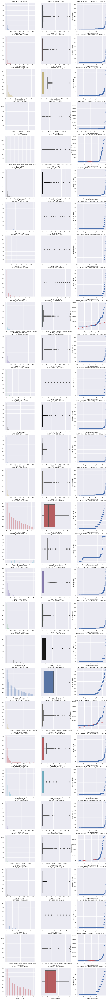

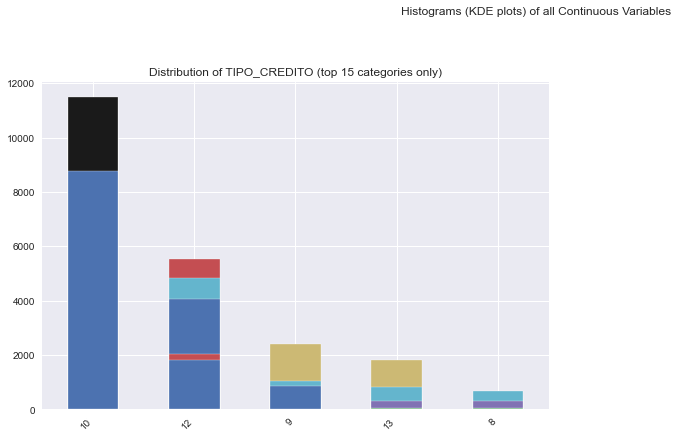

Could not draw Violin Plot


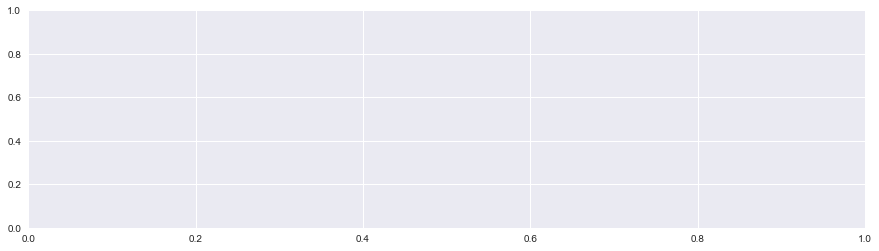

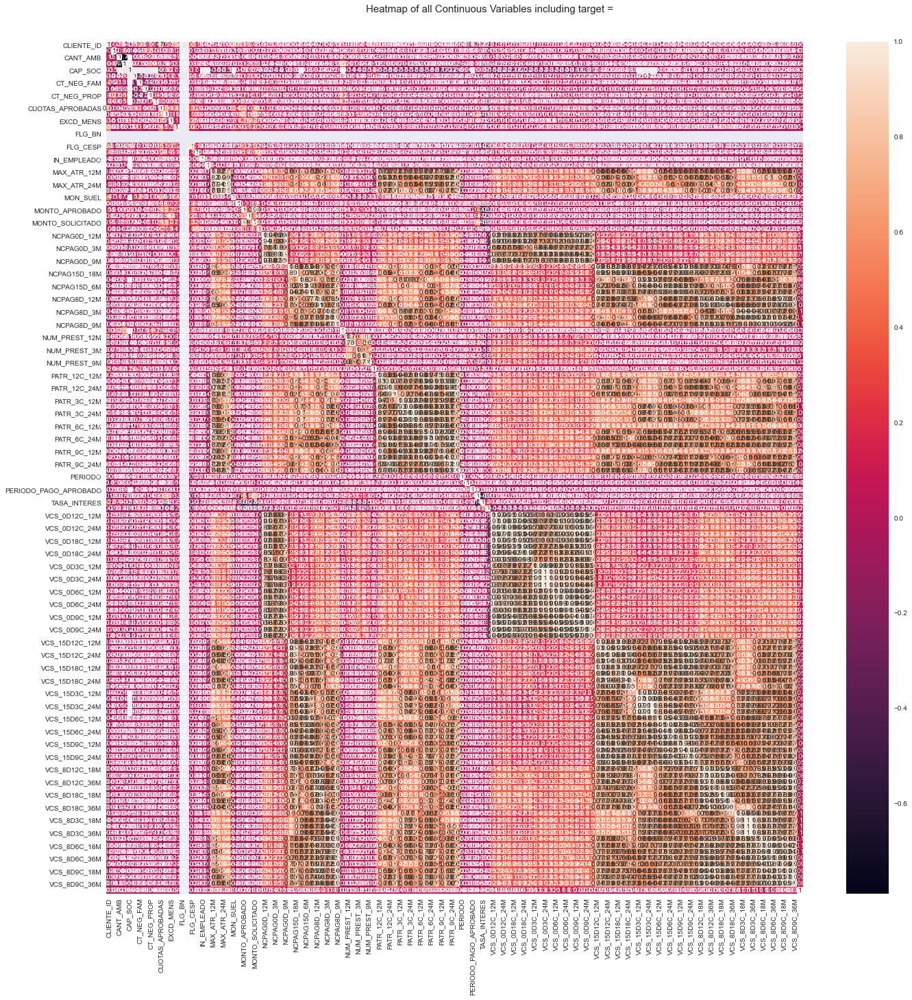

ValueError: Image size of 1440x140400 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1440x140400 with 780 Axes>

Time to run AutoViz (in seconds) = 282.372

 ###################### VISUALIZATION Completed ########################


In [78]:
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()
df = AV.AutoViz('caso_peru.csv')

In [ ]:
df = px.data('caso_peru.csv')

In [ ]:
df = dtale.show(join_data)
df.open_browser()

In [41]:
for i in join_data.columns:
  print(i)
  print(join_data[i].unique())
  print('---'*20)

ANIO_CONST_EDAD
[34 59 30 27 29 36 63 60 37 51 32 25 39 52 26 23 44 53 18 42 20 64 54 40
 22 28 41 67 50 57 58 46 21 55 35 48 31 43 38 24 45 65 61 19  4 66 47 33
 68 71 73 49  6  3 56 62 69  0 10 70 74  2 15 72 12  8  1 11 13  5  7 75
 77  9 78]
------------------------------------------------------------
CANT_AMB
[ 0.  1. nan  2.  3.]
------------------------------------------------------------
CANT_FIJO
[ 1.  2.  0. nan  3.  4.]
------------------------------------------------------------
CAP_SOC
[     nan 102000.    6913.    1000.  100000.    4800.   29000.   30000.
  40000.   25000.   50000.   41000.   60120.5      0.    4660.   62000.
   8000.    5000.   60000.   20000.   10000.   12000.   31418.  358412.
   1031.    4000.   16000.    4420.  554782.    9560.   45000.   49200.
   6000.  513749.9   1750.    9000.   75000.   70000.   11000.    9800.
   2000.   78790.    5085.   23180.    1650.   12500.    3995.   12025.
  65000.   14790.    7000.  700000.    1058. ]
-----------------

 20. 28. 16. 17. 19. 27. 21. 23.]
------------------------------------------------------------
NUM_PREST_18M
[ 6. nan  1.  5.  2.  3.  8. 10.  4. 12.  9.  7. 14. 16. 46. 11. 40. 18.
 15. 13. 30. 39. 20. 17. 27. 19. 28. 23. 34. 22. 21. 24.]
------------------------------------------------------------
NUM_PREST_3M
[ 3. nan  1.  2.  4.  6.  5.  7.  8.  9.]
------------------------------------------------------------
NUM_PREST_6M
[ 3. nan  1.  5.  2.  4.  6.  7.  8. 10. 14. 20. 12. 11.  9.]
------------------------------------------------------------
NUM_PREST_9M
[ 3. nan  1.  5.  2.  4. 10.  7.  6. 14.  8. 12.  9. 18. 11. 20. 17. 13.
 15. 27. 16. 23.]
------------------------------------------------------------
ORIGEN_CAPTACION
[ 8. 47. nan  9. 46.  7. 14. 23.  6. 11. 10.  1. 13. 15. 42. 22.  4.  0.
 18. 44. 25. 24.]
------------------------------------------------------------
PATR_12C_12M
[ 1.105    nan  0.556 ... 11.25   5.6    2.407]
----------------------------------------------------

[1.313   nan 0.556 ... 3.077 6.2   1.136]
------------------------------------------------------------
PATR_9C_36M
[ 1.313    nan  0.556 ... 17.333  3.077  1.136]
------------------------------------------------------------
PERIODO
[201211 201402 201110 201111 201208 201102 201304 201308 201206 201203
 201204 201103 201107 201406 201307 201306 201405 201106 201201 201302
 201404 201212 201309 201101 201301 201210 201209 201312 201105 201108
 201403 201112 201109 201310 201303 201205 201202 201401 201305 201207
 201104 201311]
------------------------------------------------------------
PERIODO_GRACIA
[  0 150 120   4  90  60   5   1 180   2   3   8   7   9   6  12  30  11
  10]
------------------------------------------------------------
PERIODO_PAGO_APROBADO
[30 90  7]
------------------------------------------------------------
PROF_OFI
['OTROS (SEÑALAR)' 'NO DECLARA' 'COMERCIANTE / VENDEDOR' 'TRANSPORTISTA'
 'ALBAÑIL, OBRERO DE CONSTRUCCIÓN' 'INGENIERO'
 'ACTOR,ACTRIZ,ARTISTA,DIRECT

### Estadísticas de las Variables

In [16]:
# Mostrando algunos estadísticos para todas las variables numéricas

#np.round(join_data.describe(), 2).T ---> Transpuesta
np.round(join_data.describe(), 2)

,ANIO_CONST_EDAD,CANT_AMB,CANT_FIJO,CAP_SOC,CT_NEG_ALQ,CT_NEG_FAM,CT_NEG_OTR,CT_NEG_PROP,CT_NG_PRIN,CUOTAS_APROBADAS,...,VCS_8D3C_36M,VCS_8D6C_12M,VCS_8D6C_18M,VCS_8D6C_24M,VCS_8D6C_36M,VCS_8D9C_12M,VCS_8D9C_18M,VCS_8D9C_24M,VCS_8D9C_36M,DEFAULT
count,11482.00,10075.00,10075.00,95.0,10075.00,10075.00,10075.00,10075.00,10075.0,11482.00,...,7721.00,7405.00,7545.00,7625.00,7721.00,7405.00,7545.00,7625.00,7721.00,11482.00
mean,39.70,0.10,0.94,47344.1,0.13,0.16,0.10,0.34,1.0,5.62,...,0.18,0.28,0.31,0.32,0.34,0.36,0.41,0.44,0.46,0.09
std,12.67,0.31,0.36,108871.6,0.35,0.38,0.31,0.52,0.1,8.66,...,0.62,0.89,0.95,0.98,1.00,1.10,1.19,1.26,1.31,0.29
min,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.0,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,30.00,0.00,1.00,4900.0,0.00,0.00,0.00,0.00,1.0,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
50%,39.00,0.00,1.00,14790.0,0.00,0.00,0.00,0.00,1.0,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
75%,49.00,0.00,1.00,47100.0,0.00,0.00,0.00,1.00,1.0,12.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
max,78.00,3.00,4.00,700000.0,3.00,3.00,3.00,4.00,3.0,120.00,...,10.00,10.00,10.00,12.00,12.00,14.00,14.00,14.00,16.00,1.00


In [18]:

file_name = 'Resumen_de_Estadisticas.csv'
join_data.describe().transpose().to_csv(file_name, sep=',',encoding='utf-8',index = True)


### Cambiando los nombres de las columnas para que cumplan buenas prácticas ( Tipo Titulo)

In [19]:
join_data.rename(columns=lambda x: x.title(), inplace=True)

In [20]:
join_data.head()

,Anio_Const_Edad,Cant_Amb,Cant_Fijo,Cap_Soc,Cat_Per,Cat_Pj,Cls_Dep,Cls_Ind,Ct_Neg_Alq,Ct_Neg_Fam,...,Vcs_8D3C_36M,Vcs_8D6C_12M,Vcs_8D6C_18M,Vcs_8D6C_24M,Vcs_8D6C_36M,Vcs_8D9C_12M,Vcs_8D9C_18M,Vcs_8D9C_24M,Vcs_8D9C_36M,Default
CLIENTE_ID,,,,,,,,,,,,,,,,,,,,,
50698230,34,0.0,1.0,NaN,INDEPENDIENTE,NaN,NaN,MICROEMPRESARIO,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
5058312,59,0.0,1.0,NaN,INDEPENDIENTE,NaN,NaN,MICROEMPRESARIO,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
43513877,30,0.0,1.0,NaN,INDEPENDIENTE,NaN,EMPLEADO,MICROEMPRESARIO,0.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
44051765,27,0.0,1.0,NaN,INDEPENDIENTE,NaN,EMPLEADO,MICROEMPRESARIO,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
49128417,29,0.0,1.0,NaN,INDEPENDIENTE,NaN,EMPLEADO,MICROEMPRESARIO,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


###Explorando la distribución del Target


In [21]:
# Explorando la distribucion de la variable DEFAULT

r = join_data.Default.count()
join_data.groupby('Default').size()
default_balance = pd.DataFrame(join_data.groupby('Default').size())
default_balance.columns = ['Total']
default_balance['Dist. %'] = default_balance.Total*100/r
print(join_data.shape)
default_balance

(11482, 163)


,Total,Dist. %
Default,,
0,10447,90.985891
1,1035,9.014109


# **Splitting Dataset into Training / Test**

In [22]:
# Generando las bases de entrenamiento y test, con el método "train_test_split" del paquete sklearn.
# usando una semilla 5, un 70% para la base de entrenamiento y 30% para el resto

X_train, X_test, y_train, y_test = train_test_split(join_data, join_data["Default"], random_state=5, train_size=0.7)

r1 = X_train.Default.count()
r2 = X_test.Default.count()

del X_train["Default"]
del X_test["Default"]

print(join_data.shape)


print("\n***********************************************************")
print("1) En Train")
print("Dimensiones de train_set X",X_train.shape,"")
print("Dimensiones de train_set Y",y_train.shape,"")
print("\n",y_train.value_counts()/r1)
print("***********************************************************")
print("2) En Test")
print("Dimensiones de test_set X",X_test.shape,"")
print("Dimensiones de test_set Y",y_test.shape,"")
print("\n",y_test.value_counts()/r2)
print("\n")



(11482, 163)

***********************************************************
1) En Train
Dimensiones de train_set X (8037, 162) 
Dimensiones de train_set Y (8037,) 

 0    0.90917
1    0.09083
Name: Default, dtype: float64
***********************************************************
2) En Test
Dimensiones de test_set X (3445, 162) 
Dimensiones de test_set Y (3445,) 

 0    0.911466
1    0.088534
Name: Default, dtype: float64




In [23]:
X_train.head()

,Anio_Const_Edad,Cant_Amb,Cant_Fijo,Cap_Soc,Cat_Per,Cat_Pj,Cls_Dep,Cls_Ind,Ct_Neg_Alq,Ct_Neg_Fam,...,Vcs_8D3C_24M,Vcs_8D3C_36M,Vcs_8D6C_12M,Vcs_8D6C_18M,Vcs_8D6C_24M,Vcs_8D6C_36M,Vcs_8D9C_12M,Vcs_8D9C_18M,Vcs_8D9C_24M,Vcs_8D9C_36M
CLIENTE_ID,,,,,,,,,,,,,,,,,,,,,
60359020,33,0.0,1.0,NaN,INDEPENDIENTE,NaN,NaN,MICROEMPRESARIO,1.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2234367,51,0.0,1.0,NaN,INDEPENDIENTE,NaN,NaN,MICROEMPRESARIO,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
46087349,54,0.0,1.0,NaN,INDEPENDIENTE,NaN,EMPLEADO,MICROEMPRESARIO,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5113179,38,NaN,NaN,NaN,DEPENDIENTE,NaN,EMPLEADO,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2799426,51,0.0,1.0,NaN,INDEPENDIENTE,NaN,NaN,MICROEMPRESARIO,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [24]:
print(y_train.name)
y_train.head()

Default


CLIENTE_ID
60359020    1
2234367     0
46087349    1
5113179     0
2799426     1
Name: Default, dtype: int64

# Explorando los datos

## Verificando si hay registros duplicados y eliminandolos

In [25]:
X_train.drop_duplicates(inplace = True)

<ipython-input-25-08609d87cba5>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_train.drop_duplicates(inplace = True)


## Estudiando el formato de las variables y dividiendo en DataFrame numérica y categóricas

In [26]:
# En este objeto colocamos todos los tipos de objetos numéricos
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

# Creamos un Dataframe con todas las variables de tipo numérico
df_numeric = X_train.select_dtypes(include=numerics)  

# Creamos un Dataframe con todas las variables de tipo string
df_categorical= X_train.select_dtypes(include = ['O']) 

In [27]:
print('Número de variables numéricas',df_numeric.shape[1])
print('\nNúmero de variables Categóricas',df_categorical.shape[1])

Número de variables numéricas 132

Número de variables Categóricas 30


## 1. Tabla de Estadísticas: Variables Numéricas

In [28]:
from scipy.stats import iqr

df_numeric_stats = pd.DataFrame()
df_numeric_stats = np.round(df_numeric.describe().T)

 # Rango Intercuartilico
df_numeric_stats['IQR'] = np.round(df_numeric.apply(lambda x: np.nanpercentile(x,75)),2) -np.round(df_numeric.apply(lambda x: np.nanpercentile(x,25)),2)                         
df_numeric_stats['Missin_PCT'] = np.round(df_numeric.isnull().sum()/len(df_numeric),2)           # Porcentaje de Missings
df_numeric_stats['P_1'] = np.round(df_numeric.apply(lambda x: np.nanpercentile(x,1)),2)            # Percentil 1
df_numeric_stats['P_5'] = np.round(df_numeric.apply(lambda x: np.nanpercentile(x,5)),2)            # Percentil 5
df_numeric_stats['P_95'] = np.round(df_numeric.apply(lambda x: np.nanpercentile(x,95)),2)          # Percentil 95
df_numeric_stats['P_99'] = np.round(df_numeric.apply(lambda x: np.nanpercentile(x,99)),2)          # Percentil 99
df_numeric_stats['CV'] = np.round(df_numeric.apply(lambda x: np.std(x)/np.mean(x)),2)              # Coeficiente de variacion
df_numeric_stats['Out_Zscore'] = df_numeric.apply(lambda x: np.abs(x - x.mean()) / x.std() > 2).sum()  # método z-score (asumiendo normalidad) 
df_numeric_stats['cota_bxp_inf'] = df_numeric.apply(lambda x: 2.5*np.nanpercentile(x,25)-1.5*np.nanpercentile(x,75))
df_numeric_stats['cota_bxp_sup'] = df_numeric.apply(lambda x: 2.5*np.nanpercentile(x,75)-1.5*np.nanpercentile(x,25))

#df_numeric_stats['Out_bxp_inf'] = df_numeric.apply(lambda x: 2.5*np.nanpercentile(x,25)-1.5*np.nanpercentile(x,75) > x).sum()
df_numeric_stats['Out_bxp_inf'] = np.round(df_numeric.apply(lambda x: np.nanpercentile(x,25)),2)- 1.5*df_numeric_stats.IQR
df_numeric_stats['Out_bxp_sup'] = np.round(df_numeric.apply(lambda x: np.nanpercentile(x,75)),2)+ 1.5*df_numeric_stats.IQR
#df_numeric_stats['Out_bxp_sup'] = df_numeric.apply(lambda x: 2.5*np.nanpercentile(x,75)-1.5*np.nanpercentile(x,25) < x).sum()
df_numeric_stats['Out_boxplot'] = df_numeric_stats.Out_bxp_inf+df_numeric_stats.Out_bxp_sup

df_numeric_stats.head()

ZeroDivisionError: float division by zero

## 1.1 Visualizando la distribución de cada variable numérica

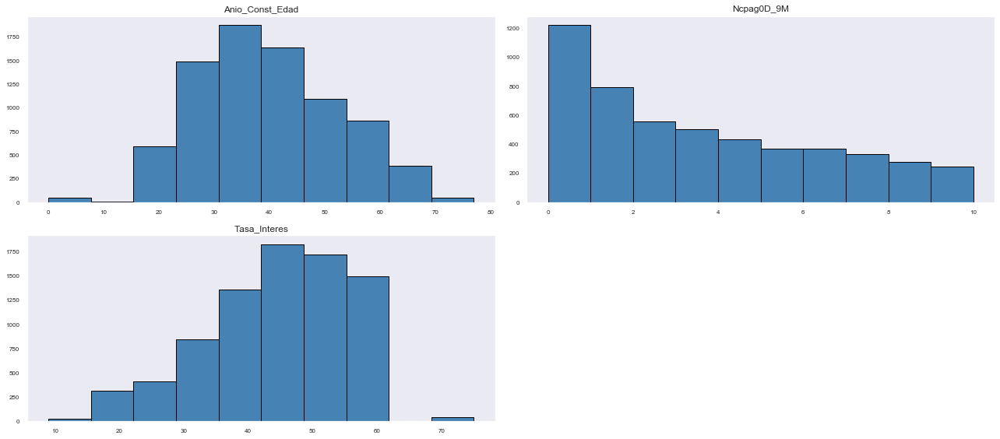

In [97]:
vector = ['Anio_Const_Edad','Tasa_Interes','Ncpag0D_9M']

df_numeric[vector].hist(bins=10, color='steelblue', edgecolor='black', linewidth=1.0,xlabelsize=8, ylabelsize=8, grid=False)    
plt.tight_layout(rect=(0, 0, 3, 2))  

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  


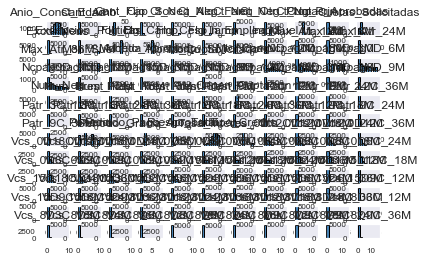

In [99]:
df_numeric.hist(bins=10, color='steelblue', edgecolor='black', linewidth=1.0,xlabelsize=8, ylabelsize=8, grid=False)    
plt.tight_layout(rect=(0, 0, 3, 2))       

## 2. Tabla de Estadísticas: Variables Categóricas

In [100]:
def index_hhi(df):  # Indice de Herfindahl
    total = len(df)
    lista = []
    for column in df:
        levels = df.groupby(column)[column].count()
        hhi_elements = (levels/total)**2
        hhi = np.round(hhi_elements.sum(),2)
        lista.append(hhi)
    return lista


df_categorical_stats = pd.DataFrame()
df_categorical_stats = np.round(df_categorical.describe().T)

df_categorical_stats['Missin_PCT'] = np.round(df_categorical.isnull().sum()/len(df_categorical),2)           # Porcentaje de Missings
df_categorical_stats['Idx_Hi'] = index_hhi(df_categorical)                                                   # Indice de Herfindahl

df_categorical_stats.head()

,count,unique,top,freq,Missin_PCT,Idx_Hi
Cat_Per,7979,5,INDEPENDIENTE,6472,0.01,0.67
Cat_Pj,58,1,Privada,58,0.99,0.00
Cls_Dep,3621,3,EMPLEADO,3111,0.55,0.15
Cls_Ind,7145,3,MICROEMPRESARIO,6850,0.11,0.73
D_Dep_Ub,8037,26,LIMA,2268,0.00,0.12


In [101]:
df_categorical.head() 

,Cat_Per,Cat_Pj,Cls_Dep,Cls_Ind,D_Dep_Ub,D_Dist_Ub,D_Prov_Ub,De_Dep_Suc,De_Dist_Suc,De_Prov_Suc,...,Nat_Jur,Niv_Edu,Prof_Ofi,Sexo,Ti_Doc_Cony1,Ti_Ident_Reg,Ti_Res,Tip_Nat_Jur,Tip_Viv_Per,Tipo_Gracia
CLIENTE_ID,,,,,,,,,,,,,,,,,,,,,
60359020,INDEPENDIENTE,NaN,NaN,MICROEMPRESARIO,LIMA,SANTIAGO DE SURCO,LIMA,LIMA,NaN,NaN,...,NaN,SECUNDARIO,COMERCIANTE / VENDEDOR,F,NaN,NaN,RESIDENTE,NaN,FAMILIAR,N
2234367,INDEPENDIENTE,NaN,NaN,MICROEMPRESARIO,ANCASH,MARCARA,CARHUAZ,ANCASH,HUARAZ,JANGAS,...,NaN,SECUNDARIO,NO DECLARA,F,NaN,NaN,NaN,NaN,OTROS,N
46087349,INDEPENDIENTE,NaN,EMPLEADO,MICROEMPRESARIO,LAMBAYEQUE,MONSEFU,CHICLAYO,LAMBAYEQUE,CHICLAYO,CHICLAYO,...,NaN,SECUNDARIO,COMERCIANTE / VENDEDOR,F,NaN,NaN,RESIDENTE,NaN,FAMILIAR,A
5113179,DEPENDIENTE,NaN,EMPLEADO,NaN,LIMA,LURIGANCHO,LIMA,LIMA,CAJATAMBO,CAJATAMBO,...,NaN,SECUNDARIO,OBRERO / OPERADOR,M,NaN,NaN,RESIDENTE,NaN,FAMILIAR,N
2799426,INDEPENDIENTE,NaN,NaN,MICROEMPRESARIO,PUNO,PUNO,PUNO,PUNO,PUNO,PUNO,...,NaN,PRIMARIO,NO DECLARA,F,C,NaN,NaN,NaN,PROPIA,N


## 2.1 Visualizando la distribución de cada variable Categórica

In [102]:
df_categorical.head()

,Cat_Per,Cat_Pj,Cls_Dep,Cls_Ind,D_Dep_Ub,D_Dist_Ub,D_Prov_Ub,De_Dep_Suc,De_Dist_Suc,De_Prov_Suc,...,Nat_Jur,Niv_Edu,Prof_Ofi,Sexo,Ti_Doc_Cony1,Ti_Ident_Reg,Ti_Res,Tip_Nat_Jur,Tip_Viv_Per,Tipo_Gracia
CLIENTE_ID,,,,,,,,,,,,,,,,,,,,,
60359020,INDEPENDIENTE,NaN,NaN,MICROEMPRESARIO,LIMA,SANTIAGO DE SURCO,LIMA,LIMA,NaN,NaN,...,NaN,SECUNDARIO,COMERCIANTE / VENDEDOR,F,NaN,NaN,RESIDENTE,NaN,FAMILIAR,N
2234367,INDEPENDIENTE,NaN,NaN,MICROEMPRESARIO,ANCASH,MARCARA,CARHUAZ,ANCASH,HUARAZ,JANGAS,...,NaN,SECUNDARIO,NO DECLARA,F,NaN,NaN,NaN,NaN,OTROS,N
46087349,INDEPENDIENTE,NaN,EMPLEADO,MICROEMPRESARIO,LAMBAYEQUE,MONSEFU,CHICLAYO,LAMBAYEQUE,CHICLAYO,CHICLAYO,...,NaN,SECUNDARIO,COMERCIANTE / VENDEDOR,F,NaN,NaN,RESIDENTE,NaN,FAMILIAR,A
5113179,DEPENDIENTE,NaN,EMPLEADO,NaN,LIMA,LURIGANCHO,LIMA,LIMA,CAJATAMBO,CAJATAMBO,...,NaN,SECUNDARIO,OBRERO / OPERADOR,M,NaN,NaN,RESIDENTE,NaN,FAMILIAR,N
2799426,INDEPENDIENTE,NaN,NaN,MICROEMPRESARIO,PUNO,PUNO,PUNO,PUNO,PUNO,PUNO,...,NaN,PRIMARIO,NO DECLARA,F,C,NaN,NaN,NaN,PROPIA,N


In [103]:
df_categorical_plot = df_categorical.fillna('NULO') 

lb_enc = preprocessing.LabelEncoder()

lb_enc_dic ={}

for i in df_categorical_plot.columns:
    lb_enc = preprocessing.LabelEncoder()
    lb_enc_dic[i] = lb_enc
    
for i in df_categorical_plot.columns:
    df_categorical_plot.loc[:,(i)] = lb_enc_dic[i].fit_transform(df_categorical_plot.loc[:,(i)].astype(str).fillna('NULL'))    

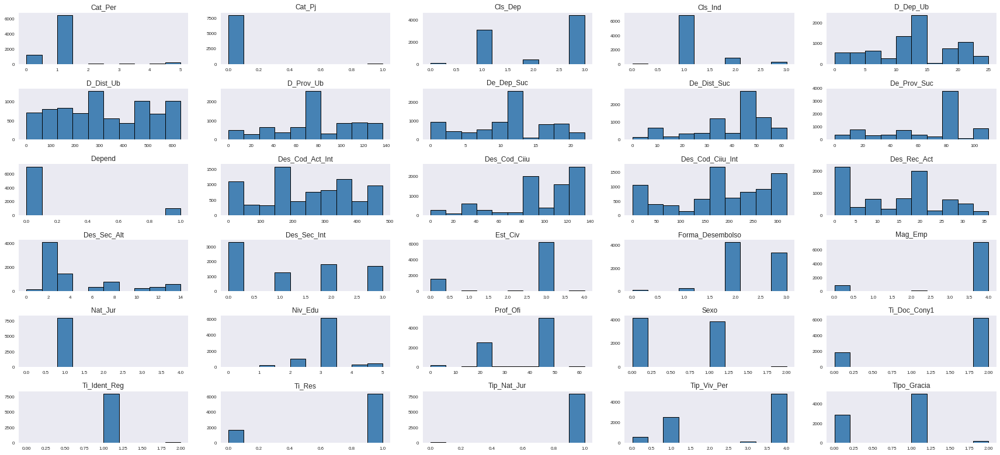

In [24]:
df_categorical_plot.hist(bins=10, color='steelblue', edgecolor='black', linewidth=1.0,xlabelsize=8, ylabelsize=8, grid=False)    
plt.tight_layout(rect=(0, 0, 3, 2))

# Deteccion y Tratamiento de Missing (Valores Faltantes)

In [139]:
#   Se va a recorrer todas columnas y se contara los valores "?" de todas las variables
#   Y se guardara los nombres  de las variables con más de 30% de registros igual a "?"

df_numeric.isnull().mean().sort_values(ascending = False)


Cap_Soc                  0.992783
Flg_Bn                   0.884658
Ncpag8D_3M               0.417942
Ncpag0D_3M               0.417942
Ncpag15D_3M              0.417942
Num_Prest_3M             0.417942
Ncpag8D_6M               0.383228
Ncpag0D_6M               0.383228
Ncpag15D_6M              0.383228
Num_Prest_6M             0.383228
Ncpag15D_9M              0.364066
Ncpag0D_9M               0.364066
Num_Prest_9M             0.364066
Ncpag8D_9M               0.364066
Ncpag0D_12M              0.351873
Vcs_0D3C_12M             0.351873
Vcs_0D9C_12M             0.351873
Patr_12C_12M             0.351873
Vcs_15D12C_12M           0.351873
Vcs_0D18C_12M            0.351873
Vcs_8D9C_12M             0.351873
Vcs_15D18C_12M           0.351873
Vcs_0D12C_12M            0.351873
Vcs_15D3C_12M            0.351873
Vcs_8D6C_12M             0.351873
Vcs_8D3C_12M             0.351873
Vcs_0D6C_12M             0.351873
Vcs_15D6C_12M            0.351873
Ncpag15D_12M             0.351873
Vcs_15D9C_12M 

In [140]:
#   Se va a recorrer todas columnas y se contara los valores "?" de todas las variables
#   Y se guardara los nombres  de las variables con más de 95% de registros igual a "?"

features_null_delete = []                                                       # Se Cambio (*)

for col in df_numeric.columns:
    if df_numeric[col].isnull().sum() > 0: 
        print(col,', Hay ',np.round(df_numeric[col].isnull().mean()*100,2),'% missings')
        if df_numeric[col].isnull().mean() > 0.95:
                features_null_delete.append(col)
            
features_null_delete  # En este vector se guarda los nombres de las variables a eliminar

Cant_Amb , Hay  12.08 % missings
Cant_Fijo , Hay  12.08 % missings
Cap_Soc , Hay  99.28 % missings
Ct_Neg_Alq , Hay  12.08 % missings
Ct_Neg_Fam , Hay  12.08 % missings
Ct_Neg_Otr , Hay  12.08 % missings
Ct_Neg_Prop , Hay  12.08 % missings
Ct_Ng_Prin , Hay  12.08 % missings
Flg_Bn , Hay  88.47 % missings
Flg_Camp , Hay  6.42 % missings
Flg_Cesp , Hay  6.42 % missings
Ing_Suel , Hay  0.75 % missings
Max_Atr_12M , Hay  35.19 % missings
Max_Atr_18M , Hay  34.12 % missings
Max_Atr_24M , Hay  33.3 % missings
Max_Atr_36M , Hay  32.49 % missings
Mon_Suel , Hay  0.75 % missings
Ncpag0D_12M , Hay  35.19 % missings
Ncpag0D_18M , Hay  34.12 % missings
Ncpag0D_3M , Hay  41.79 % missings
Ncpag0D_6M , Hay  38.32 % missings
Ncpag0D_9M , Hay  36.41 % missings
Ncpag15D_12M , Hay  35.19 % missings
Ncpag15D_18M , Hay  34.12 % missings
Ncpag15D_3M , Hay  41.79 % missings
Ncpag15D_6M , Hay  38.32 % missings
Ncpag15D_9M , Hay  36.41 % missings
Ncpag8D_12M , Hay  35.19 % missings
Ncpag8D_18M , Hay  34.12 % m

['Cap_Soc']

In [141]:
df_numeric["Max_Atr_12M"].describe()

count    5209.000000
mean     5.374928   
std      9.029104   
min      0.000000   
25%      1.000000   
50%      3.000000   
75%      6.000000   
max      309.000000 
Name: Max_Atr_12M, dtype: float64

In [142]:
df_numeric["Max_Atr_12M"].head(10)

CLIENTE_ID
60359020   NaN  
2234367     4.0 
46087349    1.0 
5113179     4.0 
2799426     30.0
51347159    1.0 
4813788    NaN  
2270419     27.0
46432183   NaN  
4375007     2.0 
Name: Max_Atr_12M, dtype: float64

In [ ]:
# Estrategia Simple, imputando los valores perdidos con la Mediana

from sklearn.preprocessing import Imputer

df_numeric_imp = df_numeric
df_numeric_imp = df_numeric_imp.drop(features_null_delete, axis = 1)

imp_1 = Imputer(missing_values='NaN',strategy='median',axis=0) # En strategy se puede cambiar por  "mean" / "most_frequent"


          
for i in df_numeric_imp.columns:
  df_numeric_imp.loc[:,(i)] = imp_1.fit_transform(df_numeric_imp.loc[:,(i)].values.reshape(-1,1))

print('\n')

# Nuevo Dataframe sin Missings o valores perdidos

df_numeric_imp.isnull().mean().sort_values(ascending = False)

In [145]:
df_numeric_imp["Max_Atr_12M"].head(10)

CLIENTE_ID
60359020    3.0 
2234367     4.0 
46087349    1.0 
5113179     4.0 
2799426     30.0
51347159    1.0 
4813788     3.0 
2270419     27.0
46432183    3.0 
4375007     2.0 
Name: Max_Atr_12M, dtype: float64

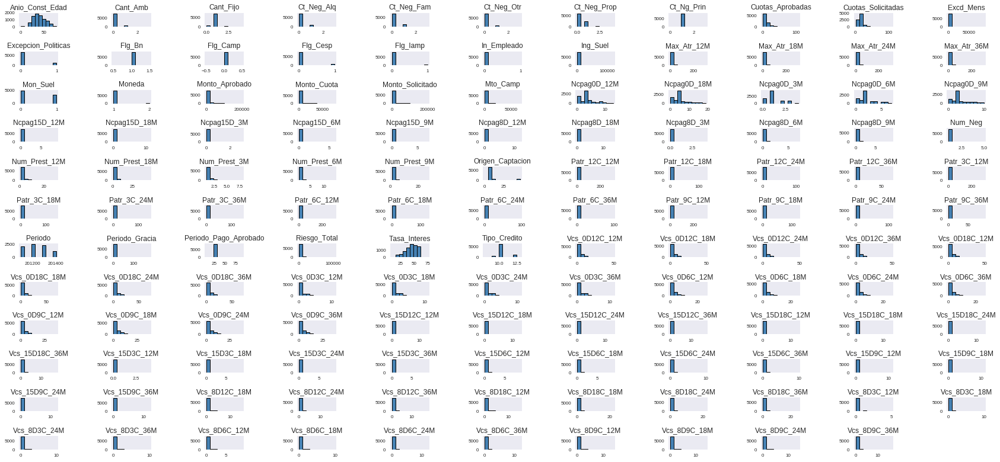

In [146]:
df_numeric_imp.hist(bins=10, color='steelblue', edgecolor='black', linewidth=1.0,xlabelsize=8, ylabelsize=8, grid=False)    
plt.tight_layout(rect=(0, 0, 3, 2))

In [29]:
df_numeric_imp.head()

,Anio_Const_Edad,Cant_Amb,Cant_Fijo,Ct_Neg_Alq,Ct_Neg_Fam,Ct_Neg_Otr,Ct_Neg_Prop,Ct_Ng_Prin,Cuotas_Aprobadas,Cuotas_Solicitadas,...,Vcs_8D3C_24M,Vcs_8D3C_36M,Vcs_8D6C_12M,Vcs_8D6C_18M,Vcs_8D6C_24M,Vcs_8D6C_36M,Vcs_8D9C_12M,Vcs_8D9C_18M,Vcs_8D9C_24M,Vcs_8D9C_36M
CLIENTE_ID,,,,,,,,,,,,,,,,,,,,,
60359020,33.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,12.0,12.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2234367,51.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,6.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
46087349,54.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,15.0,15.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5113179,38.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,12.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2799426,51.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,12.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [30]:
df_numeric_imp.describe()

,Anio_Const_Edad,Cant_Amb,Cant_Fijo,Ct_Neg_Alq,Ct_Neg_Fam,Ct_Neg_Otr,Ct_Neg_Prop,Ct_Ng_Prin,Cuotas_Aprobadas,Cuotas_Solicitadas,...,Vcs_8D3C_24M,Vcs_8D3C_36M,Vcs_8D6C_12M,Vcs_8D6C_18M,Vcs_8D6C_24M,Vcs_8D6C_36M,Vcs_8D9C_12M,Vcs_8D9C_18M,Vcs_8D9C_24M,Vcs_8D9C_36M
count,8037.000000,8037.000000,8037.000000,8037.000000,8037.00000,8037.000000,8037.000000,8037.000000,8037.000000,8037.000000,...,8037.000000,8037.000000,8037.000000,8037.000000,8037.000000,8037.000000,8037.000000,8037.000000,8037.000000,8037.000000
mean,39.774294,0.088590,0.950106,0.108623,0.14172,0.086973,0.304591,0.999253,5.630832,12.680851,...,0.116337,0.120443,0.177305,0.199328,0.212144,0.223964,0.232052,0.265024,0.286799,0.307329
std,12.601991,0.288946,0.343646,0.324496,0.36346,0.287063,0.503887,0.095958,8.577493,7.107424,...,0.499156,0.509908,0.720905,0.779008,0.816036,0.844923,0.903936,0.985806,1.052145,1.107741
min,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,0.000000,1.000000,0.000000,0.00000,0.000000,0.000000,1.000000,0.000000,9.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,39.000000,0.000000,1.000000,0.000000,0.00000,0.000000,0.000000,1.000000,0.000000,12.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,49.000000,0.000000,1.000000,0.000000,0.00000,0.000000,1.000000,1.000000,12.000000,12.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,77.000000,3.000000,4.000000,3.000000,3.00000,3.000000,4.000000,3.000000,108.000000,108.000000,...,10.000000,10.000000,9.000000,10.000000,12.000000,12.000000,14.000000,14.000000,14.000000,16.000000


### Los Missings en las variables Categoricas, se tomarán como un nivel más a los ya existentes. Veremos su tratamiento más adelante en la etapa de Transformaciones.

# Deteccion y Tratamiento de Outliers

In [31]:
extreme = False
outliers_amount = []

for column in df_numeric_imp.columns:
    q1, q3 = np.percentile(df_numeric_imp[column],[25,75])
    iqr = q3 - q1
    constant = 1.5 if not extreme else 3
    result_df = df_numeric_imp[~((df_numeric_imp[column]>(q3+constant*iqr)) | (df_numeric_imp[column]<(q1-constant*iqr)))]
    if result_df.shape != df_numeric_imp.shape:
        print ("outliers detected in", column, ": ", str(df_numeric_imp.shape[0] - result_df.shape[0]))
    outliers_amount.append(df_numeric_imp.shape[0] - result_df.shape[0])
print("total outliers:",str(sum(outliers_amount)))

df_outliers = pd.DataFrame(outliers_amount,columns = ["amount"])

outliers detected in Anio_Const_Edad :  13
outliers detected in Cant_Amb :  703
outliers detected in Cant_Fijo :  910
outliers detected in Ct_Neg_Alq :  840
outliers detected in Ct_Neg_Fam :  1100
outliers detected in Ct_Neg_Otr :  688
outliers detected in Ct_Neg_Prop :  18
outliers detected in Ct_Ng_Prin :  71
outliers detected in Cuotas_Aprobadas :  123
outliers detected in Cuotas_Solicitadas :  1914
outliers detected in Excd_Mens :  997
outliers detected in Excepcion_Politicas :  1247
outliers detected in Flg_Cesp :  429
outliers detected in Flg_Iamp :  190
outliers detected in In_Empleado :  10
outliers detected in Ing_Suel :  1636
outliers detected in Max_Atr_12M :  1041
outliers detected in Max_Atr_18M :  1013
outliers detected in Max_Atr_24M :  1146
outliers detected in Max_Atr_36M :  1193
outliers detected in Moneda :  45
outliers detected in Monto_Aprobado :  1014
outliers detected in Monto_Cuota :  961
outliers detected in Monto_Solicitado :  1032
outliers detected in Mto_Cam

/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:454: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  box_data = remove_na(group_data)


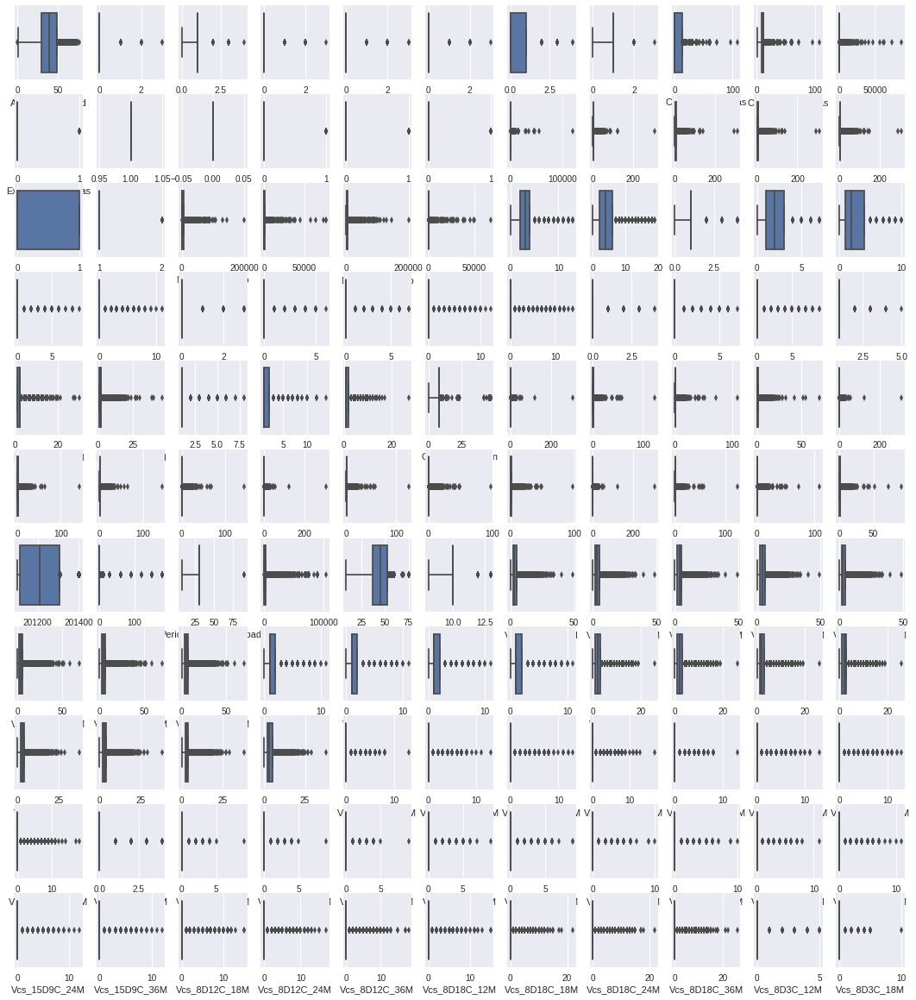

In [32]:
# Visualizando las variables con Outliers

import matplotlib.pyplot as plt
import math

#vector = ['Anio_Const_Edad','Ct_Neg_Fam','Ing_Suel','Vcs_8D18C_36M']
vector = df_numeric_imp.columns

n = len(vector)
cols = int(np.round(math.sqrt(n),0))
rows = int(np.round(math.sqrt(n),0))

fig, ax = plt.subplots(nrows=rows, ncols=cols,figsize=(10, 30))
fig.set_size_inches(18.5, 20.5, forward=True)

i=-1
for row in ax:
      for col in row:
          i=i+1
          sns.boxplot(df_numeric_imp.loc[:,(vector[i])], ax=col,whis=[0.01,0.99])
        

plt.show()

### Tratamiento de Outliers

In [33]:
df_numeric_stats

,count,mean,std,min,25%,50%,75%,max,IQR,Missin_PCT,...,P_5,P_95,P_99,CV,Out_Zscore,cota_bxp_inf,cota_bxp_sup,Out_bxp_inf,Out_bxp_sup,Out_boxplot
Anio_Const_Edad,8037.0,40.0,13.0,0.0,30.0,39.0,49.0,77.0,19.00,0.00,...,22.0,62.00,68.00,0.32,304,1.50,77.50,1.50,77.50,79.00
Cant_Amb,7066.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.00,0.12,...,0.0,1.00,1.00,3.04,703,0.00,0.00,0.00,0.00,0.00
Cant_Fijo,7066.0,1.0,0.0,0.0,1.0,1.0,1.0,4.0,0.00,0.12,...,0.0,1.00,2.00,0.39,910,1.00,1.00,1.00,1.00,2.00
Cap_Soc,58.0,42123.0,93243.0,0.0,4850.0,22500.0,50000.0,700000.0,45150.00,0.99,...,1000.0,100000.00,359140.00,2.19,1,-62875.00,117725.00,-62875.00,117725.00,54850.00
Ct_Neg_Alq,7066.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.00,0.12,...,0.0,1.00,1.00,2.78,840,0.00,0.00,0.00,0.00,0.00
Ct_Neg_Fam,7066.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.00,0.12,...,0.0,1.00,1.00,2.38,1100,0.00,0.00,0.00,0.00,0.00
Ct_Neg_Otr,7066.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.00,0.12,...,0.0,1.00,1.00,3.08,688,0.00,0.00,0.00,0.00,0.00
Ct_Neg_Prop,7066.0,0.0,1.0,0.0,0.0,0.0,1.0,4.0,1.00,0.12,...,0.0,1.00,2.00,1.51,127,-1.50,2.50,-1.50,2.50,1.00
Ct_Ng_Prin,7066.0,1.0,0.0,0.0,1.0,1.0,1.0,3.0,0.00,0.12,...,1.0,1.00,1.00,0.10,71,1.00,1.00,1.00,1.00,2.00
Cuotas_Aprobadas,8037.0,6.0,9.0,0.0,0.0,0.0,12.0,108.0,12.00,0.00,...,0.0,24.00,36.00,1.52,490,-18.00,30.00,-18.00,30.00,12.00


In [34]:
#vector = ['P_1','P_95','Out_bxp_inf','Out_bxp_sup']
vector = ['P_1','P_99','Out_bxp_inf','Out_bxp_sup']

df_numeric_imp_out = df_numeric_imp

for col in df_numeric_imp_out.columns:
    percentiles = df_numeric_stats[vector]
    percentiles = percentiles[percentiles.index.values == col].values
    print(percentiles[0,0],percentiles[0,1])
    df_numeric_imp_out[col][df_numeric_imp_out[col] <= percentiles[0,0] ] = percentiles[0,0]
    df_numeric_imp_out[col][df_numeric_imp_out[col] >= percentiles[0,1] ] = percentiles[0,1]

19.0 68.0
0.0 1.0
0.0 2.0
0.0 1.0
0.0 1.0
0.0 1.0
0.0 2.0
1.0 1.0
0.0 36.0
1.0 36.0
0.0 9887.52
0.0 1.0
1.0 1.0
0.0 0.0
0.0 1.0
0.0 1.0
0.0 0.0
0.0 3000.0
0.0 36.0
0.0 46.06
0.0 52.0
0.0 56.0
0.0 1.0
1.0 1.0
350.0 64500.68
67.82 8668.42
350.0 70000.0
0.0 3973.96
0.0 12.0
0.0 18.0
0.0 3.0
0.0 6.0
0.0 9.0
0.0 4.0
0.0 5.0
0.0 1.0
0.0 2.44
0.0 3.0
0.0 6.0
0.0 7.0
0.0 2.0
0.0 4.0
0.0 5.0
1.0 2.0
1.0 11.92
1.0 15.0
1.0 4.0
1.0 7.0
1.0 9.0
8.0 47.0
0.0 12.59
0.0 13.76
0.0 14.19
0.0 13.64
0.0 15.67
0.0 16.72
0.0 18.08
0.0 18.38
0.0 15.12
0.0 16.5
0.0 16.9
0.0 17.29
0.0 13.56
0.0 14.67
0.0 15.04
0.0 15.09
201101.0 201406.0
0.0 90.0
30.0 30.0
21.81 50000.0
18.0 60.0
9.0 12.0
0.0 22.0
0.0 22.06
0.0 22.0
0.0 22.0
0.0 22.0
0.0 31.0
0.0 32.0
0.0 32.0
0.0 6.0
0.0 6.0
0.0 6.0
0.0 6.0
0.0 12.0
0.0 12.0
0.0 12.0
0.0 12.0
0.0 17.0
0.0 17.0
0.0 17.0
0.0 17.0
0.0 4.0
0.0 5.0
0.0 5.0
0.0 5.0
0.0 4.0
0.0 5.0
0.0 5.0
0.0 6.0
0.0 2.0
0.0 2.0
0.0 2.0
0.0 2.0
0.0 3.0
0.0 4.0
0.0 4.0
0.0 4.0
0.0 4.0
0.0 4.0
0.0 4

/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:454: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  box_data = remove_na(group_data)


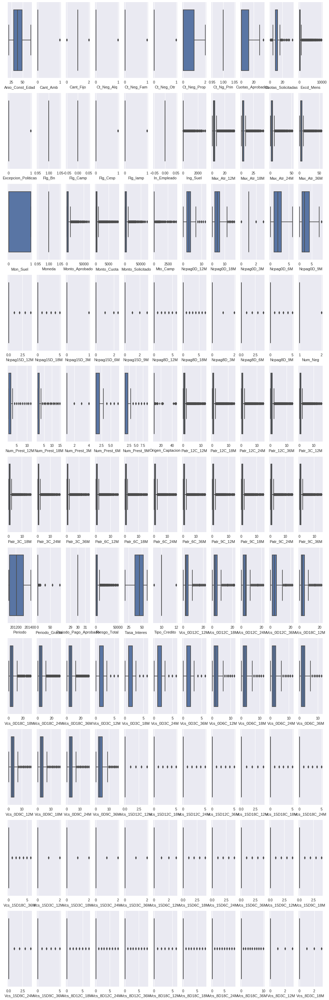

In [35]:
# Visualizando las variables Sin Outliers

import matplotlib.pyplot as plt
import math

#vector = ['Anio_Const_Edad','Ct_Neg_Fam','Ing_Suel','Vcs_8D18C_36M']
vector = df_numeric_imp_out.columns

n = len(vector)
cols = int(np.round(math.sqrt(n),0))
rows = int(np.round(math.sqrt(n),0))

fig, ax = plt.subplots(nrows=rows, ncols=cols,figsize=(10, 60))
plt.subplots_adjust(bottom=0.1, right=0.8, top=2)
fig.set_size_inches(18.5, 20.5, forward=True)

i=-1
for row in ax:
      for col in row:
          i=i+1
          sns.boxplot(df_numeric_imp_out.loc[:,(vector[i])],ax=col,whis = 1.5 )  #whis = 1.5  # whis =[0.01,0.99]
          
        

plt.show()

# Transformaciones de Variables

## 1.  Variables Numéricas

### 1.1 Transformación Escalamiento MinMax

In [36]:
# Creando una instancia del Transformador

minmax_scale = preprocessing.MinMaxScaler(feature_range=(1,2))

# Asignando a un dataframe, el dataframe ya transformado por MinMaxScaler
df_num_io_minmax = pd.DataFrame(minmax_scale.fit_transform(df_numeric_imp_out),index=df_numeric_imp_out.index.values, columns=df_numeric_imp_out.columns)

# Ordenando el dataframe ya transformado por la varianza de cada variable y veremos que variable podemos descartar por no tener variabilida
df_num_io_minmax.var().sort_values(ascending = False)

Mon_Suel                 0.240623
Excepcion_Politicas      0.131100
Ct_Neg_Fam               0.118149
Periodo                  0.107888
Ct_Neg_Alq               0.093605
Ncpag0D_3M               0.089785
Origen_Captacion         0.086723
Cant_Amb                 0.079829
Ct_Neg_Otr               0.078286
Tipo_Credito             0.073373
Ncpag0D_6M               0.073041
Tasa_Interes             0.067795
Ncpag0D_9M               0.066740
Anio_Const_Edad          0.062989
Ct_Neg_Prop              0.060618
Ncpag0D_12M              0.057144
Flg_Cesp                 0.050535
Ncpag0D_18M              0.049577
Cuotas_Aprobadas         0.048585
Vcs_0D3C_36M             0.043602
Vcs_0D3C_24M             0.043073
Vcs_0D3C_18M             0.042658
Vcs_0D3C_12M             0.041667
Num_Prest_3M             0.039532
Num_Prest_9M             0.039021
Vcs_0D6C_36M             0.035866
Num_Neg                  0.035708
Vcs_0D9C_36M             0.035268
Vcs_0D6C_24M             0.035210
Vcs_0D6C_18M  

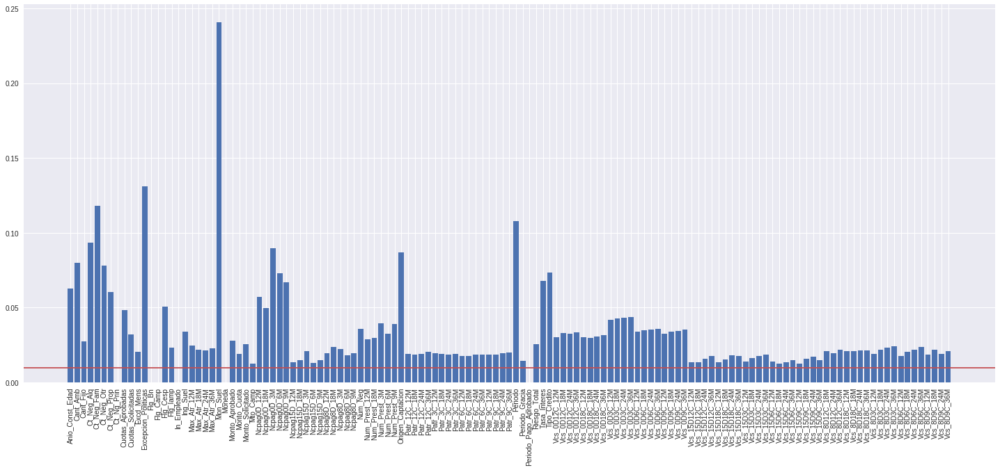

In [37]:
# Visualizando la varianza de las variables transformadas

plt.figure(figsize=(25,10))
plt.bar(df_num_io_minmax.var().sort_values(ascending = False).index.values, df_num_io_minmax.var().sort_values(ascending = False))
plt.xticks(df_num_io_minmax.var().sort_values(ascending = False).index.values, df_num_io_minmax.var().sort_values(ascending = False).index.values, rotation='vertical')
plt.axhline(y=0.01, color='r', linestyle='-')
plt.show()

In [38]:
# Se guarda en un df los nombres de las variables numericas con varianza menor a 0.01, transformadas por el metodo min-max

delete_low_numeric_variance = df_num_io_minmax.var()[df_num_io_minmax.var()<0.01].index.values
delete_low_numeric_variance

array(['Ct_Ng_Prin', 'Flg_Bn', 'Flg_Camp', 'In_Empleado', 'Moneda',
       'Periodo_Pago_Aprobado'], dtype=object)

In [ ]:
# De la base df_num_io_minmax, se eliminan las variables numericas con menor varianza a 0.01

for i in delete_low_numeric_variance:
    del df_num_io_minmax[i]    

In [40]:
df_num_io_minmax.describe().T


,count,mean,std,min,25%,50%,75%,max
Anio_Const_Edad,8037.0,1.425753,0.250975,1.0,1.224490,1.408163,1.612245,2.0
Cant_Amb,8037.0,1.087470,0.282541,1.0,1.000000,1.000000,1.000000,2.0
Cant_Fijo,8037.0,1.473871,0.166215,1.0,1.500000,1.500000,1.500000,2.0
Ct_Neg_Alq,8037.0,1.104517,0.305949,1.0,1.000000,1.000000,1.000000,2.0
Ct_Neg_Fam,8037.0,1.136867,0.343728,1.0,1.000000,1.000000,1.000000,2.0
Ct_Neg_Otr,8037.0,1.085604,0.279796,1.0,1.000000,1.000000,1.000000,2.0
Ct_Neg_Prop,8037.0,1.151051,0.246207,1.0,1.000000,1.000000,1.500000,2.0
Cuotas_Aprobadas,8037.0,1.153046,0.220420,1.0,1.000000,1.000000,1.333333,2.0
Cuotas_Solicitadas,8037.0,1.329316,0.179492,1.0,1.228571,1.314286,1.314286,2.0
Excd_Mens,8037.0,1.046963,0.142933,1.0,1.000000,1.000000,1.030240,2.0


### 1.2 Transformación : Escalamiento Robusto

In [190]:
df_numeric_imp_out.shape

(8037, 131)

In [181]:

# Creando una instancia del Transformador

robust_scale_est = preprocessing.RobustScaler() # Por defecto toma el 1er y 3er cuartil

# Asignando a un dataframe, el dataframe ya transformado por MinMaxScaler
df_num_io_robust = pd.DataFrame(robust_scale_est.fit_transform(df_numeric_imp_out),index=df_numeric_imp_out.index.values, columns=df_numeric_imp_out.columns)

# Ordenando el dataframe ya transformado por la varianza de cada variable y veremos que variable podemos descartar por no tener variabilida
df_num_io_robust.var().sort_values(ascending = False)

Ing_Suel                 304620.900928
Mto_Camp                 196119.456527
Origen_Captacion         131.906120   
Periodo_Gracia           116.210199   
Excd_Mens                22.340850    
Patr_3C_36M              11.413432    
Patr_6C_18M              10.933547    
Patr_3C_24M              10.813876    
Patr_3C_12M              10.707648    
Monto_Cuota              9.891097     
Patr_3C_18M              9.581330     
Patr_6C_12M              9.181658     
Patr_9C_18M              8.992113     
Patr_12C_24M             8.646692     
Patr_6C_36M              8.070284     
Max_Atr_12M              8.046407     
Patr_9C_24M              7.940777     
Max_Atr_36M              7.914811     
Patr_6C_24M              7.878043     
Patr_12C_18M             7.870914     
Monto_Solicitado         7.816321     
Patr_9C_12M              7.713191     
Patr_12C_12M             7.651212     
Patr_9C_36M              7.560454     
Monto_Aprobado           7.148857     
Patr_12C_36M             

In [182]:
# Se guarda en un df los nombres de las variables numericas con varianza menor a 0.01, transformadas por el metodo min-max

delete_low_numeric_variance = df_num_io_robust.var()[df_num_io_robust.var()<0.02].index.values
delete_low_numeric_variance

array(['Ct_Ng_Prin', 'Flg_Bn', 'Flg_Camp', 'In_Empleado', 'Moneda',
       'Periodo_Pago_Aprobado'], dtype=object)

In [ ]:
# De la base df_num_io_minmax, se eliminan las variables numericas con menor varianza a 0.01

for i in delete_low_numeric_variance:
    del df_num_io_robust[i]    

In [184]:
df_num_io_robust.describe().T.head()

,count,mean,std,min,25%,50%,75%,max
Anio_Const_Edad,8037.0,0.045363,0.647252,-1.052632,-0.473684,0.0,0.526316,1.526316
Cant_Amb,8037.0,0.087470,0.282541,0.000000,0.000000,0.0,0.000000,1.000000
Cant_Fijo,8037.0,-0.052258,0.332429,-1.000000,0.000000,0.0,0.000000,1.000000
Ct_Neg_Alq,8037.0,0.104517,0.305949,0.000000,0.000000,0.0,0.000000,1.000000
Ct_Neg_Fam,8037.0,0.136867,0.343728,0.000000,0.000000,0.0,0.000000,1.000000


## 2. Variables Categóricas

In [45]:
for i in df_categorical.columns:
    print (i,'\n',df_categorical[i].fillna('NULO').value_counts(),"\n")

Cat_Per 
 INDEPENDIENTE    6472
DEPENDIENTE      1202
SIN INGRESOS     237 
NULO             58  
MIXTO            40  
NINGUNA          28  
Name: Cat_Per, dtype: int64 

Cat_Pj 
 NULO       7979
Privada    58  
Name: Cat_Pj, dtype: int64 

Cls_Dep 
 NULO                4416
EMPLEADO            3111
INFORMALES          407 
CUARTA CATEGORIA    103 
Name: Cls_Dep, dtype: int64 

Cls_Ind 
 MICROEMPRESARIO       6850
NULO                  892 
PEQUEÑO EMPRESARIO    269 
MEDIANO EMPRESARIO    26  
Name: Cls_Ind, dtype: int64 

D_Dep_Ub 
 LIMA                    2268
PIURA                   749 
PUNO                    673 
LA LIBERTAD             590 
ANCASH                  528 
LAMBAYEQUE              520 
AREQUIPA                406 
CAJAMARCA               350 
CUSCO                   291 
JUNIN                   245 
SAN MARTIN              216 
TACNA                   205 
PROV CONST DEL CALLA    182 
ICA                     180 
AYACUCHO                137 
LORETO                  

## 2.1 Label Encode

In [ ]:
df_cat_label_code = df_categorical.fillna('NULO')

In [47]:
df_cat_label_code.head()

,Cat_Per,Cat_Pj,Cls_Dep,Cls_Ind,D_Dep_Ub,D_Dist_Ub,D_Prov_Ub,De_Dep_Suc,De_Dist_Suc,De_Prov_Suc,...,Nat_Jur,Niv_Edu,Prof_Ofi,Sexo,Ti_Doc_Cony1,Ti_Ident_Reg,Ti_Res,Tip_Nat_Jur,Tip_Viv_Per,Tipo_Gracia
CLIENTE_ID,,,,,,,,,,,,,,,,,,,,,
60359020,INDEPENDIENTE,NULO,NULO,MICROEMPRESARIO,LIMA,SANTIAGO DE SURCO,LIMA,LIMA,NULO,NULO,...,NULO,SECUNDARIO,COMERCIANTE / VENDEDOR,F,NULO,NULO,RESIDENTE,NULO,FAMILIAR,N
2234367,INDEPENDIENTE,NULO,NULO,MICROEMPRESARIO,ANCASH,MARCARA,CARHUAZ,ANCASH,HUARAZ,JANGAS,...,NULO,SECUNDARIO,NO DECLARA,F,NULO,NULO,NULO,NULO,OTROS,N
46087349,INDEPENDIENTE,NULO,EMPLEADO,MICROEMPRESARIO,LAMBAYEQUE,MONSEFU,CHICLAYO,LAMBAYEQUE,CHICLAYO,CHICLAYO,...,NULO,SECUNDARIO,COMERCIANTE / VENDEDOR,F,NULO,NULO,RESIDENTE,NULO,FAMILIAR,A
5113179,DEPENDIENTE,NULO,EMPLEADO,NULO,LIMA,LURIGANCHO,LIMA,LIMA,CAJATAMBO,CAJATAMBO,...,NULO,SECUNDARIO,OBRERO / OPERADOR,M,NULO,NULO,RESIDENTE,NULO,FAMILIAR,N
2799426,INDEPENDIENTE,NULO,NULO,MICROEMPRESARIO,PUNO,PUNO,PUNO,PUNO,PUNO,PUNO,...,NULO,PRIMARIO,NO DECLARA,F,C,NULO,NULO,NULO,PROPIA,N


In [ ]:
lb_enc = preprocessing.LabelEncoder()

lb_enc_dic ={}

for i in df_cat_label_code.columns:
    lb_enc = preprocessing.LabelEncoder()
    lb_enc_dic[i] = lb_enc
    
for i in df_cat_label_code.columns:
    df_cat_label_code.loc[:,(i)] = lb_enc_dic[i].fit_transform(df_cat_label_code.loc[:,(i)].astype(str).fillna('NULO')) 

In [49]:
df_cat_label_code.head()

,Cat_Per,Cat_Pj,Cls_Dep,Cls_Ind,D_Dep_Ub,D_Dist_Ub,D_Prov_Ub,De_Dep_Suc,De_Dist_Suc,De_Prov_Suc,...,Nat_Jur,Niv_Edu,Prof_Ofi,Sexo,Ti_Doc_Cony1,Ti_Ident_Reg,Ti_Res,Tip_Nat_Jur,Tip_Viv_Per,Tipo_Gracia
CLIENTE_ID,,,,,,,,,,,,,,,,,,,,,
60359020,1,0,3,1,13,536,82,11,46,77,...,1,3,19,0,2,1,1,1,1,1
2234367,1,0,3,1,1,320,27,0,34,59,...,1,3,44,0,2,1,0,1,3,1
46087349,1,0,1,1,12,345,38,10,21,32,...,1,3,19,0,2,1,1,1,1,0
5113179,0,0,1,2,13,305,82,11,11,15,...,1,3,47,1,2,1,1,1,1,1
2799426,1,0,3,1,21,448,106,18,52,86,...,1,2,44,0,0,1,0,1,4,1


## 2.2  Mean Encode

In [ ]:
# Funcion para identificar la tasa de Exito (Target) con respecto al de la columnas (col) 

def mean_categorica(df_in,col, df_targ,col_y):

    df_x = pd.concat([df_in[col],df_targ], ignore_index=False,axis=1)
    df_xa = pd.crosstab(df_x[col], df_x[col_y],margins=True,margins_name="Total")                                        # Distribucion de Cada celda vs el total
    df_xb = pd.crosstab(df_x[col], df_x[col_y], margins=True,margins_name="Dist").apply(lambda r: r/len(df_x), axis=1)   # Distribucion de Cada Nivel (total) vs el total
    df_xc = pd.crosstab(df_x[col], df_x[col_y],values=df_x[col_y],margins=True,margins_name="RD",aggfunc='mean')         # Calculando la media del evento de exito por cada nivel
    df_xd = pd.concat([df_xa,df_xb['Dist']],ignore_index=False,axis=1)
    df_xd = pd.concat([df_xd,df_xc['RD']],ignore_index=False,axis=1)
    df_xd[col] = df_xd.index 
    df_xd = df_xd.drop(['Total', 'Dist','RD'])

    df_res = df_x.reset_index().merge(df_xd, how="left").set_index('CLIENTE_ID')
    df_res = df_res['RD']
    return df_res

In [ ]:
# Asigando a todas las variables categoricas, la palabra 'NULO' cuando sea NaN

df_cat_mean_code = df_categorical.fillna('NULO')

In [ ]:
# Reemplazando ya la variable transformada

target = y_train
name_y = 'Default'

for col in df_cat_mean_code:
    df_cat_mean_code[col] = mean_categorica(df_cat_mean_code,col,target,name_y)

In [53]:
print(df_cat_mean_code['Sexo'].nunique())
df_cat_mean_code.head()


3


,Cat_Per,Cat_Pj,Cls_Dep,Cls_Ind,D_Dep_Ub,D_Dist_Ub,D_Prov_Ub,De_Dep_Suc,De_Dist_Suc,De_Prov_Suc,...,Nat_Jur,Niv_Edu,Prof_Ofi,Sexo,Ti_Doc_Cony1,Ti_Ident_Reg,Ti_Res,Tip_Nat_Jur,Tip_Viv_Per,Tipo_Gracia
CLIENTE_ID,,,,,,,,,,,,,,,,,,,,,
60359020,0.088226,0.090112,0.084013,0.087737,0.093915,0.121951,0.093216,0.090615,0.086865,0.086213,...,0.090112,0.092917,0.073767,0.083716,0.103787,0.090112,0.074965,0.090112,0.122240,0.084891
2234367,0.088226,0.090112,0.084013,0.087737,0.085227,0.000000,0.088889,0.087379,0.089655,0.045455,...,0.090112,0.092917,0.090371,0.083716,0.103787,0.090112,0.152999,0.090112,0.195652,0.084891
46087349,0.088226,0.090112,0.100932,0.087737,0.082692,0.192308,0.087591,0.088106,0.124481,0.138462,...,0.090112,0.092917,0.073767,0.083716,0.103787,0.090112,0.074965,0.090112,0.122240,0.102519
5113179,0.099834,0.090112,0.100932,0.124439,0.093915,0.108696,0.093216,0.090615,0.088339,0.088339,...,0.090112,0.092917,0.086420,0.096984,0.103787,0.090112,0.074965,0.090112,0.122240,0.084891
2799426,0.088226,0.090112,0.084013,0.087737,0.083210,0.038462,0.035211,0.081917,0.075410,0.027027,...,0.090112,0.075049,0.090371,0.083716,0.046969,0.090112,0.152999,0.090112,0.065659,0.084891


In [54]:
df_categorical['Sexo'].value_counts()

F    4133
M    3846
Name: Sexo, dtype: int64

In [55]:
df_cat_mean_code['Sexo'].value_counts()

0.083716    4133
0.096984    3846
0.189655    58  
Name: Sexo, dtype: int64

## 2.3 One Hot Encode

In [ ]:
# Asigando a todas las variables categoricas, la palabra 'NULO' cuando sea NaN

df_cat_onehot_code = df_categorical.fillna('NULO')

In [57]:
encoder = []
one_hot = []

for i in df_cat_onehot_code.columns:
    if len(df_cat_onehot_code[i].value_counts().index)>5:  # No se Escoge más de 5 Niveles
        encoder.append(i)
    else:
        one_hot.append(i)
    print (i, len(df_cat_onehot_code[i].value_counts().index))

Cat_Per 6
Cat_Pj 2
Cls_Dep 4
Cls_Ind 4
D_Dep_Ub 26
D_Dist_Ub 634
D_Prov_Ub 138
De_Dep_Suc 23
De_Dist_Suc 63
De_Prov_Suc 111
Depend 2
Des_Cod_Act_Int 479
Des_Cod_Ciiu 136
Des_Cod_Ciiu_Int 320
Des_Rec_Act 37
Des_Sec_Alt 15
Des_Sec_Int 4
Est_Civ 5
Forma_Desembolso 4
Mag_Emp 5
Nat_Jur 5
Niv_Edu 6
Prof_Ofi 63
Sexo 3
Ti_Doc_Cony1 3
Ti_Ident_Reg 3
Ti_Res 2
Tip_Nat_Jur 2
Tip_Viv_Per 5
Tipo_Gracia 3


In [ ]:
for i in df_cat_onehot_code.columns:
    df_cat_onehot_code.loc[:,(i)] = lb_enc_dic[i].fit_transform(df_cat_onehot_code.loc[:,(i)])

In [ ]:
one_hot_dic = {}
for i in one_hot:
    one_hot_dic[i] = OneHotEncoder()
    

In [60]:
# Reiniciamos los indices

df_cat_onehot_code.reset_index(inplace=True)

# one-hot encodeamos

for j in one_hot:
    print (j)
    one_hot_temp = one_hot_dic[j].fit_transform(df_cat_onehot_code[j].values.reshape(-1,1)).toarray()
    onehot_df = pd.DataFrame(one_hot_temp, columns=[j+" "+str(x) for x in range(0,one_hot_temp.shape[1])])
    onehot_df.reset_index(inplace = True)
    df_cat_onehot_code = pd.concat([df_cat_onehot_code, onehot_df], axis = 1)

Cat_Pj
Cls_Dep
Cls_Ind
Depend
Des_Sec_Int
Est_Civ
Forma_Desembolso
Mag_Emp
Nat_Jur
Sexo
Ti_Doc_Cony1
Ti_Ident_Reg
Ti_Res
Tip_Nat_Jur
Tip_Viv_Per
Tipo_Gracia


In [61]:
# Borramos del Data Frame las variables originales
# manteniendo las variables one-hot encodeadas

for i in one_hot:
    del df_cat_onehot_code[i]

del df_cat_onehot_code["index"]  # Borramos la columna index

df_cat_onehot_code.columns

Index(['CLIENTE_ID', 'Cat_Per', 'D_Dep_Ub', 'D_Dist_Ub', 'D_Prov_Ub',
       'De_Dep_Suc', 'De_Dist_Suc', 'De_Prov_Suc', 'Des_Cod_Act_Int',
       'Des_Cod_Ciiu', 'Des_Cod_Ciiu_Int', 'Des_Rec_Act', 'Des_Sec_Alt',
       'Niv_Edu', 'Prof_Ofi', 'Cat_Pj 0', 'Cat_Pj 1', 'Cls_Dep 0', 'Cls_Dep 1',
       'Cls_Dep 2', 'Cls_Dep 3', 'Cls_Ind 0', 'Cls_Ind 1', 'Cls_Ind 2',
       'Cls_Ind 3', 'Depend 0', 'Depend 1', 'Des_Sec_Int 0', 'Des_Sec_Int 1',
       'Des_Sec_Int 2', 'Des_Sec_Int 3', 'Est_Civ 0', 'Est_Civ 1', 'Est_Civ 2',
       'Est_Civ 3', 'Est_Civ 4', 'Forma_Desembolso 0', 'Forma_Desembolso 1',
       'Forma_Desembolso 2', 'Forma_Desembolso 3', 'Mag_Emp 0', 'Mag_Emp 1',
       'Mag_Emp 2', 'Mag_Emp 3', 'Mag_Emp 4', 'Nat_Jur 0', 'Nat_Jur 1',
       'Nat_Jur 2', 'Nat_Jur 3', 'Nat_Jur 4', 'Sexo 0', 'Sexo 1', 'Sexo 2',
       'Ti_Doc_Cony1 0', 'Ti_Doc_Cony1 1', 'Ti_Doc_Cony1 2', 'Ti_Ident_Reg 0',
       'Ti_Ident_Reg 1', 'Ti_Ident_Reg 2', 'Ti_Res 0', 'Ti_Res 1',
       'Tip_Nat_Jur 0', 'Tip_

In [62]:
df_cat_onehot_code.head()

,CLIENTE_ID,Cat_Per,D_Dep_Ub,D_Dist_Ub,D_Prov_Ub,De_Dep_Suc,De_Dist_Suc,De_Prov_Suc,Des_Cod_Act_Int,Des_Cod_Ciiu,...,Tip_Nat_Jur 0,Tip_Nat_Jur 1,Tip_Viv_Per 0,Tip_Viv_Per 1,Tip_Viv_Per 2,Tip_Viv_Per 3,Tip_Viv_Per 4,Tipo_Gracia 0,Tipo_Gracia 1,Tipo_Gracia 2
0,60359020,1,13,536,82,11,46,77,449,133,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,2234367,1,1,320,27,0,34,59,306,127,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
2,46087349,1,12,345,38,10,21,32,37,120,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
3,5113179,0,13,305,82,11,11,15,169,89,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
4,2799426,1,21,448,106,18,52,86,37,120,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


# Uniendo los DataFrames

In [63]:
df_num_io_robust.head()
df_cat_mean_code.head()

,Cat_Per,Cat_Pj,Cls_Dep,Cls_Ind,D_Dep_Ub,D_Dist_Ub,D_Prov_Ub,De_Dep_Suc,De_Dist_Suc,De_Prov_Suc,...,Nat_Jur,Niv_Edu,Prof_Ofi,Sexo,Ti_Doc_Cony1,Ti_Ident_Reg,Ti_Res,Tip_Nat_Jur,Tip_Viv_Per,Tipo_Gracia
CLIENTE_ID,,,,,,,,,,,,,,,,,,,,,
60359020,0.088226,0.090112,0.084013,0.087737,0.093915,0.121951,0.093216,0.090615,0.086865,0.086213,...,0.090112,0.092917,0.073767,0.083716,0.103787,0.090112,0.074965,0.090112,0.122240,0.084891
2234367,0.088226,0.090112,0.084013,0.087737,0.085227,0.000000,0.088889,0.087379,0.089655,0.045455,...,0.090112,0.092917,0.090371,0.083716,0.103787,0.090112,0.152999,0.090112,0.195652,0.084891
46087349,0.088226,0.090112,0.100932,0.087737,0.082692,0.192308,0.087591,0.088106,0.124481,0.138462,...,0.090112,0.092917,0.073767,0.083716,0.103787,0.090112,0.074965,0.090112,0.122240,0.102519
5113179,0.099834,0.090112,0.100932,0.124439,0.093915,0.108696,0.093216,0.090615,0.088339,0.088339,...,0.090112,0.092917,0.086420,0.096984,0.103787,0.090112,0.074965,0.090112,0.122240,0.084891
2799426,0.088226,0.090112,0.084013,0.087737,0.083210,0.038462,0.035211,0.081917,0.075410,0.027027,...,0.090112,0.075049,0.090371,0.083716,0.046969,0.090112,0.152999,0.090112,0.065659,0.084891


In [ ]:
X_train_proc = pd.concat([df_num_io_robust, df_cat_mean_code], axis=1)

df_join = pd.concat([df_num_io_robust, df_cat_mean_code,y_train], axis=1)

# Seleccion de Variables

## A. Selección Por XGBoost

In [ ]:
from xgboost import XGBClassifier

In [ ]:
model = XGBClassifier()

In [67]:
model.fit(X_train_proc, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
       n_jobs=1, nthread=None, objective='binary:logistic', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=1)

In [68]:
df_feature_importance_Xgboost = pd.DataFrame(model.feature_importances_, columns= ["importance"]) # Creamos un dataframe
df_feature_importance_Xgboost["feature"] = X_train_proc.columns
df_feature_importance_Xgboost.sort_values(by="importance", ascending = False)

,importance,feature
130,0.200351,D_Dist_Ub
136,0.179262,Des_Cod_Act_Int
147,0.063269,Prof_Ofi
61,0.040422,Periodo
151,0.038664,Ti_Res
64,0.036907,Tasa_Interes
144,0.029877,Mag_Emp
0,0.028120,Anio_Const_Edad
138,0.024605,Des_Cod_Ciiu_Int
8,0.022847,Cuotas_Solicitadas


In [69]:
xgboost_features = df_feature_importance_Xgboost[df_feature_importance_Xgboost["importance"]>0]["feature"].values
xgboost_features

array(['Anio_Const_Edad', 'Cant_Amb', 'Ct_Neg_Fam', 'Ct_Neg_Otr',
       'Ct_Neg_Prop', 'Cuotas_Aprobadas', 'Cuotas_Solicitadas',
       'Excd_Mens', 'Excepcion_Politicas', 'Flg_Iamp', 'Ing_Suel',
       'Max_Atr_12M', 'Max_Atr_18M', 'Max_Atr_24M', 'Max_Atr_36M',
       'Monto_Aprobado', 'Monto_Cuota', 'Monto_Solicitado', 'Ncpag0D_18M',
       'Ncpag0D_3M', 'Ncpag0D_6M', 'Ncpag0D_9M', 'Ncpag8D_6M',
       'Num_Prest_18M', 'Num_Prest_6M', 'Num_Prest_9M', 'Patr_12C_12M',
       'Patr_12C_18M', 'Patr_12C_36M', 'Patr_3C_12M', 'Patr_3C_24M',
       'Patr_3C_36M', 'Patr_6C_12M', 'Patr_6C_24M', 'Patr_6C_36M',
       'Patr_9C_12M', 'Patr_9C_18M', 'Patr_9C_24M', 'Patr_9C_36M',
       'Periodo', 'Riesgo_Total', 'Tasa_Interes', 'Tipo_Credito',
       'Vcs_0D12C_18M', 'Vcs_0D12C_24M', 'Vcs_0D18C_18M', 'Vcs_0D18C_24M',
       'Vcs_0D18C_36M', 'Vcs_0D3C_12M', 'Vcs_0D6C_12M', 'Vcs_0D9C_18M',
       'Vcs_0D9C_36M', 'Vcs_15D3C_18M', 'Vcs_8D18C_36M', 'Vcs_8D9C_12M',
       'Cat_Per', 'D_Dep_Ub', 'D_Dist

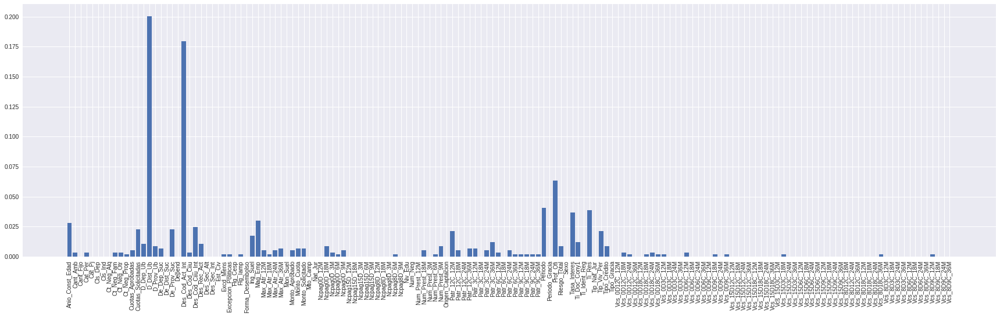

In [70]:
plt.figure(figsize=(30,8))
plt.bar(df_feature_importance_Xgboost.sort_values(by="importance", ascending = False)["feature"],df_feature_importance_Xgboost.sort_values(by="importance", ascending = False)["importance"])
plt.xticks(df_feature_importance_Xgboost.sort_values(by="importance", ascending = False)["feature"], df_feature_importance_Xgboost.sort_values(by="importance", ascending = False)["feature"], rotation='vertical')
plt.show()

## B. Selección Por Random Forest


In [ ]:
rf = RandomForestClassifier(n_estimators=100, max_depth=2,random_state=0)

In [72]:
rf.fit(X_train_proc, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=2, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=1,
            oob_score=False, random_state=0, verbose=0, warm_start=False)

In [73]:
#ordenamos de mayor a menor importancia

df_feature_importance_rf = pd.DataFrame(rf.feature_importances_, columns= ["importance"])
df_feature_importance_rf["feature"] = X_train_proc.columns
df_feature_importance_rf.sort_values(by="importance", ascending = False)

,importance,feature
130,0.109196,D_Dist_Ub
138,0.107073,Des_Cod_Ciiu_Int
136,0.096453,Des_Cod_Act_Int
137,0.053179,Des_Cod_Ciiu
56,0.046922,Patr_6C_36M
55,0.033719,Patr_6C_24M
53,0.029793,Patr_6C_12M
51,0.029284,Patr_3C_24M
52,0.028873,Patr_3C_36M
134,0.028053,De_Prov_Suc


In [74]:
rforest_features = df_feature_importance_rf[df_feature_importance_rf["importance"]>0]["feature"].values
rforest_features

array(['Anio_Const_Edad', 'Ct_Neg_Fam', 'Ct_Neg_Prop', 'Cuotas_Aprobadas',
       'Flg_Iamp', 'Max_Atr_12M', 'Max_Atr_18M', 'Max_Atr_24M',
       'Max_Atr_36M', 'Monto_Aprobado', 'Ncpag0D_6M', 'Ncpag0D_9M',
       'Ncpag15D_18M', 'Ncpag8D_12M', 'Ncpag8D_18M', 'Ncpag8D_6M',
       'Ncpag8D_9M', 'Patr_12C_12M', 'Patr_12C_18M', 'Patr_12C_24M',
       'Patr_12C_36M', 'Patr_3C_12M', 'Patr_3C_18M', 'Patr_3C_24M',
       'Patr_3C_36M', 'Patr_6C_12M', 'Patr_6C_18M', 'Patr_6C_24M',
       'Patr_6C_36M', 'Patr_9C_12M', 'Patr_9C_18M', 'Patr_9C_24M',
       'Patr_9C_36M', 'Riesgo_Total', 'Tasa_Interes', 'Vcs_0D12C_18M',
       'Vcs_0D12C_24M', 'Vcs_0D3C_12M', 'Vcs_0D3C_18M', 'Vcs_0D3C_36M',
       'Vcs_0D6C_12M', 'Vcs_0D6C_18M', 'Vcs_0D6C_24M', 'Vcs_0D6C_36M',
       'Vcs_0D9C_24M', 'Vcs_0D9C_36M', 'Vcs_15D12C_24M', 'Vcs_8D12C_24M',
       'Vcs_8D18C_12M', 'Vcs_8D18C_18M', 'Vcs_8D18C_24M', 'Vcs_8D18C_36M',
       'Vcs_8D3C_12M', 'Vcs_8D3C_24M', 'Vcs_8D6C_36M', 'Vcs_8D9C_12M',
       'Vcs_8D9C_36M'

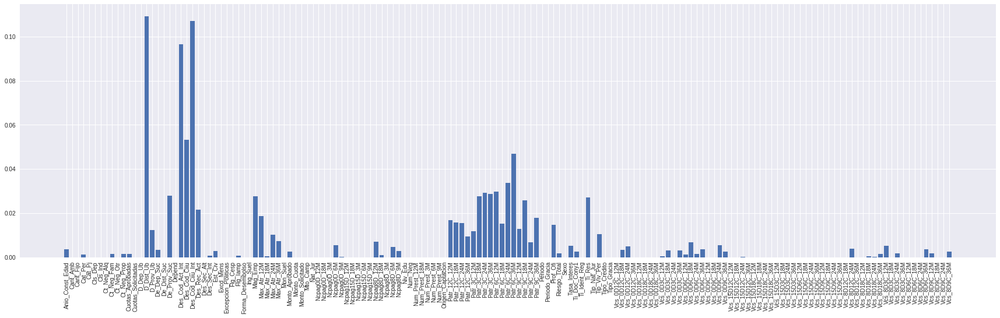

In [75]:
plt.figure(figsize=(30,8))
plt.bar(df_feature_importance_rf.sort_values(by="importance", ascending = False)["feature"],df_feature_importance_rf.sort_values(by="importance", ascending = False)["importance"])
plt.xticks(df_feature_importance_rf.sort_values(by="importance", ascending = False)["feature"], df_feature_importance_rf.sort_values(by="importance", ascending = False)["feature"], rotation='vertical')
plt.show()

# Matriz de Correlacion

### Generando Matriz de Correlacion

In [104]:
# Donde xgboost_features puede cambiarse o enriquecerse con otro grupo de variables seleccionadas con diferentes metodos


#df_join = pd.concat([X_train_proc[rforest_features],y_train], axis=1)

df_join = pd.concat([X_train_proc[xgboost_features],y_train], axis=1)

NameError: name 'X_train_proc' is not defined

In [105]:
# Generando la matriz de correlaciones
corr = df_join.corr()
corr.head(10)

NameError: name 'df_join' is not defined

In [106]:
# Graficando la matriz de Correlacion

mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

NameError: name 'corr' is not defined

NameError: name 'corr' is not defined

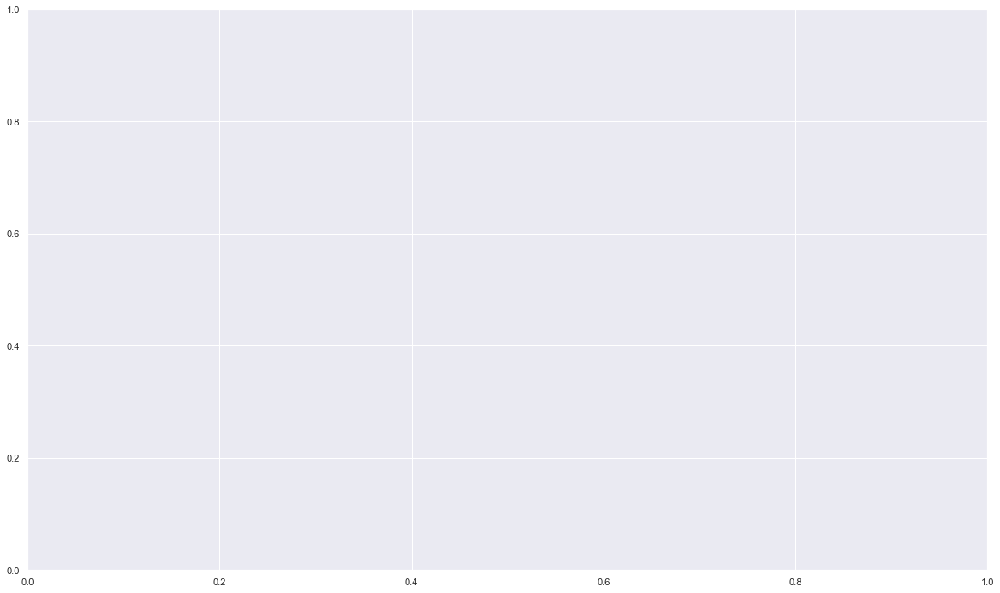

In [107]:
f, ax = plt.subplots(figsize=(20, 12))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .7})

### Determinar qué par de variables están correlacionadas

In [ ]:
for index_1, row in corr.iteritems():
    for index_2, row in corr.iteritems():
        if (abs(corr[index_1][index_2])>0.5) & (index_1 != index_2):
            print (index_1,"|", index_2, "|", "|", corr[index_1][index_2])

### Estudiar los pares de variables correlacionadas para quedarse solamente con una del par

In [108]:
print("La correlación entre Cuotas_Solicitadas  e Y: ",abs(corr["Cuotas_Solicitadas"]["Default"]))
print("La correlación entre Monto_Aprobado  e Y: ",abs(corr["Monto_Aprobado"]["Default"]))
print("La correlación entre Monto_Solicitado  e Y: ",abs(corr["Monto_Solicitado"]["Default"]))

NameError: name 'corr' is not defined

In [109]:
print("La correlación entre Max_Atr_12M  e Y: ",abs(corr["Max_Atr_12M"]["Default"]))
print("La correlación entre Max_Atr_18M  e Y: ",abs(corr["Max_Atr_18M"]["Default"]))

NameError: name 'corr' is not defined

In [110]:
import pandas as pd
import scipy.stats as scs

def categories(series):
    return range(int(series.min()), int(series.max()) + 1)
  
def chi_square_of_df_cols(col1, col2):
    df_col1, df_col2 = col1, col2

    #result = [[sum((df_col1 == cat1) & (df_col2 == cat2)) for cat2 in categories(df_col2)] for cat1 in categories(df_col1)]
    cats1, cats2 = categories(df_col1), categories(df_col2)

    def aux(is_cat1):
        return [sum(is_cat1 & (df_col2 == cat2))
                for cat2 in cats2]

    result = [aux(df_col1 == cat1)             for cat1 in cats1]
    chi2, p, dof, ex = scs.chi2_contingency(result)
    return (chi2, p)

In [111]:
print(chi_square_of_df_cols(df_join['Max_Atr_12M'], y_train))             # Estadistico Chi-squared = 41.37 and p-value = 0.0008245382797385986
#print(chi_square_of_df_cols(df_join['Max_Atr_18M'], y_train))            # Estadistico Chi-squared = 310.99 and p-value = 1.33e-69

### Se elige porque el estadistico Chi-squared es mas alto y su p-value es mucho menor al compararlo con la variable Target

NameError: name 'df_join' is not defined

# Modelamiento

## Asignamiento de bases de Entrenamiento, según variables mas relacionadas con la variable Default (Metodos XGBoost, Random Forest)

In [112]:
X_train_after = X_train_proc[xgboost_features]

print(X_train_proc.shape," - ",X_train_after.shape)

NameError: name 'X_train_proc' is not defined

## Aplicando Transformaciones a la base de Test

In [ ]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

# Creamos un Dataframe con todas las variables de tipo numérico
dft_numeric = X_test.select_dtypes(include=numerics)  

# Creamos un Dataframe con todas las variables de tipo string
dft_categorical= X_test.select_dtypes(include = ['O']) 




In [ ]:
# Aplicando la imputacion en la base de test (numericas)

dft_numeric_imp = pd.DataFrame(imp_1.transform(dft_numeric),index=dft_numeric.index.values,columns=dft_numeric.columns)

dft_numeric_imp= dft_numeric_imp.drop(columns=['Cap_Soc'])

In [ ]:
# Asignando la transformacion  robusta en la base de test (numericas)

dft_num_io_robust = pd.DataFrame(robust_scale_est.transform(dft_numeric_imp),index=dft_numeric_imp.index.values, columns=dft_numeric_imp.columns)

In [ ]:
# Asignando la transformacion  mean code en la base de test (categoricas)

  # Asigando a todas las variables categoricas, la palabra 'NULO' cuando sea NaN

dft_cat_mean_code = dft_categorical.fillna('NULO')

  # Reemplazando ya la variable transformada

target = y_test
name_y = 'Default'

for col in dft_cat_mean_code:
    dft_cat_mean_code[col] = mean_categorica(dft_cat_mean_code,col,target,name_y)

In [ ]:
# Uniendo Dataframes

X_test_proc = pd.concat([dft_num_io_robust, dft_cat_mean_code], axis=1)
X_test_proc = X_test_proc[xgboost_features]

### Preparando un DataFrame para los Análisis de Cada Modelo

In [ ]:
def CMatrix(CM, labels=['pay','default']):
    df = pd.DataFrame(data=CM, index=labels, columns=labels)
    df.index.name='TRUE'
    df.columns.name='PREDICTION'
    df.loc['Total'] = df.sum()
    df['Total'] = df.sum(axis=1)
    return df

In [ ]:
# Data frame for evaluation metrics
metrics = pd.DataFrame(index=['accuracy', 'precision', 'recall'], 
                      columns=['NULL','LogisticReg', 'ClassTree', 'SVM','RandomForest','XGBoost'])

> Accuracy (Exactitud): la proporción del número total de predicciones que son correctas
> Precisión: la proporción de predicciones positivas que son realmente correctas
> Recall: la proporción de valores positivos observados correctamente predichos como tales

En esta aplicación:

> Accuracy (Exactitud) : en general, la frecuencia con la que el modelo pronostique correctamente a los que hagan Default y no no hagan Default
> Precisión: cuando el modelo predice si las personas caerán en Default: ¿con qué frecuencia es correcto?
> Recall: la proporción de personas que caen en Default que el modelo predice correctamente

¿Qué Métrica debemos usar?

> Falsos Positivos: Una persona que pagará será predicho como Default.
> Falsos Negativos: Una Persona que hará Default sera predicho como pagador.
> Los falso negativos son peores => Por lo tanto se buscara un mejor recall





## Modelo Nulo: Siempre predice la misma categoría

In [297]:
y_pred_test = np.repeat(y_train.value_counts().idxmax(), y_test.size)
metrics.loc['accuracy','NULL'] = accuracy_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['precision','NULL'] = precision_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['recall','NULL'] = recall_score(y_pred=y_pred_test, y_true=y_test)

CM = confusion_matrix(y_pred=y_pred_test, y_true=y_test)
CMatrix(CM)

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


PREDICTION,pay,default,Total
TRUE,,,
pay,3140,0,3140
default,305,0,305
Total,3445,0,3445


## Regresion Logística

In [298]:
# 1. Importando el objeto Estimador (modelo)
from sklearn.linear_model import LogisticRegression

# 2. Creando una instancia del Estimador
logistic_regression = LogisticRegression(n_jobs=1, random_state=15)  # -1 Pone a trabajar todos los cores de tu PC, escoger un número

# 3. Usando nuestra base de entrenamiento para entrenar nuestro estimador

logistic_regression.fit(X_train_after, y_train)



LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=15, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [299]:
# 4. Evaluando el Modelo

y_pred_test = logistic_regression.predict(X_test_proc)
metrics.loc['accuracy','LogisticReg'] = accuracy_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['precision','LogisticReg'] = precision_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['recall','LogisticReg'] = recall_score(y_pred=y_pred_test, y_true=y_test)
#Confusion matrix
CM = confusion_matrix(y_pred=y_pred_test, y_true=y_test)
CMatrix(CM)

PREDICTION,pay,default,Total
TRUE,,,
pay,3105,35,3140
default,237,68,305
Total,3342,103,3445


## Arboles de Decisión

In [301]:
# 1. Importando el objeto Estimador (modelo)
from sklearn.tree import DecisionTreeClassifier

# 2. Creando una instancia del Estimador

    # min_samples_split: El número mínimo de muestras necesarias para dividir un nodo interno.
    # min_samples_leaf:  El número mínimo de muestras requeridas para estar en un nodo hoja. 
    
class_tree = DecisionTreeClassifier(min_samples_split=30, min_samples_leaf=10, random_state=10)  # Parametros (minimo de registros por hoja)

# 3. Usando nuestra base de entrenamiento para entrenar nuestro estimador

class_tree.fit(X_train_after, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=10, min_samples_split=30,
            min_weight_fraction_leaf=0.0, presort=False, random_state=10,
            splitter='best')

In [302]:
# 4. Evaluando el Modelo

y_pred_test = class_tree.predict(X_test_proc)
metrics.loc['accuracy','ClassTree'] = accuracy_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['precision','ClassTree'] = precision_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['recall','ClassTree'] = recall_score(y_pred=y_pred_test, y_true=y_test)
#Confusion matrix
CM = confusion_matrix(y_pred=y_pred_test, y_true=y_test)
CMatrix(CM)

PREDICTION,pay,default,Total
TRUE,,,
pay,3035,105,3140
default,226,79,305
Total,3261,184,3445


## Support Vector Machine

In [316]:
# 1. Importando el objeto Estimador (modelo)
from sklearn import svm

# 2. Creando una instancia del Estimador
svm = svm.SVC()  

# 3. Usandonuestra base de entrenamiento para entrenar nuestro estimador

svm.fit(X_train_after, y_train)


SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [317]:
# 4. Evaluando el Modelo

y_pred_test = svm.predict(X_test_proc)
metrics.loc['accuracy','SVM'] = accuracy_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['precision','SVM'] = precision_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['recall','SVM'] = recall_score(y_pred=y_pred_test, y_true=y_test)
#Confusion matrix
CM = confusion_matrix(y_pred=y_pred_test, y_true=y_test)
CMatrix(CM)

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples.
  'precision', 'predicted', average, warn_for)


PREDICTION,pay,default,Total
TRUE,,,
pay,3140,0,3140
default,305,0,305
Total,3445,0,3445


## Modelos Ensamblados

### A. Random Forest

In [ ]:
#Seting the Hyper Parameters
param_grid = {"max_depth": [3,5, 7, 10,None],
              "n_estimators":[3,5,10,25,50],
              "max_features": [4,7,15,20]}

#Creating the classifier
model = RandomForestClassifier(random_state=2)

grid_search = GridSearchCV(model, param_grid=param_grid, cv=5, scoring='recall', verbose=4)
grid_search.fit(X_train_after, y_train)

In [319]:
print(grid_search.best_score_)
print(grid_search.best_params_)

0.19999880688800598
{'max_depth': None, 'max_features': 20, 'n_estimators': 3}


In [320]:
# 2. Creando una instancia del Estimador, con los parámetros encontrados en la celda anterior

rf = RandomForestClassifier(max_depth=None, max_features=20, n_estimators=3, random_state=2)

# 3. Usandonuestra base de entrenamiento para entrenar nuestro estimador, con los mejores parametros

rf.fit(X_train_after, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features=20, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=3, n_jobs=1,
            oob_score=False, random_state=2, verbose=0, warm_start=False)

In [321]:
# 4. Evaluando el Modelo

y_pred_test = rf.predict(X_test_proc)
metrics.loc['accuracy','RandomForest'] = accuracy_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['precision','RandomForest'] = precision_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['recall','RandomForest'] = recall_score(y_pred=y_pred_test, y_true=y_test)
#Confusion matrix
CM = confusion_matrix(y_pred=y_pred_test, y_true=y_test)
CMatrix(CM)

PREDICTION,pay,default,Total
TRUE,,,
pay,3051,89,3140
default,245,60,305
Total,3296,149,3445


### XGBoost

In [ ]:
# 1. Importando el objeto Estimador (modelo)
from xgboost import XGBClassifier

In [323]:
# 2. Creando una instancia del Estimador
xgboost = XGBClassifier()

# 3. Usandonuestra base de entrenamiento para entrenar nuestro estimador
xgboost.fit(X_train_after, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
       n_jobs=1, nthread=None, objective='binary:logistic', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=1)

In [324]:
# 4. Evaluando el Modelo

y_pred_test = class_tree.predict(X_test_proc)
metrics.loc['accuracy','XGBoost'] = accuracy_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['precision','XGBoost'] = precision_score(y_pred=y_pred_test, y_true=y_test)
metrics.loc['recall','XGBoost'] = recall_score(y_pred=y_pred_test, y_true=y_test)
#Confusion matrix
CM = confusion_matrix(y_pred=y_pred_test, y_true=y_test)
CMatrix(CM)

PREDICTION,pay,default,Total
TRUE,,,
pay,3035,105,3140
default,226,79,305
Total,3261,184,3445


# Validación

In [326]:
100*metrics

,NULL,LogisticReg,ClassTree,SVM,RandomForest,XGBoost
accuracy,91.1466,92.1045,90.3919,91.1466,90.3048,90.3919
precision,0,66.0194,42.9348,0,40.2685,42.9348
recall,0,22.2951,25.9016,0,19.6721,25.9016


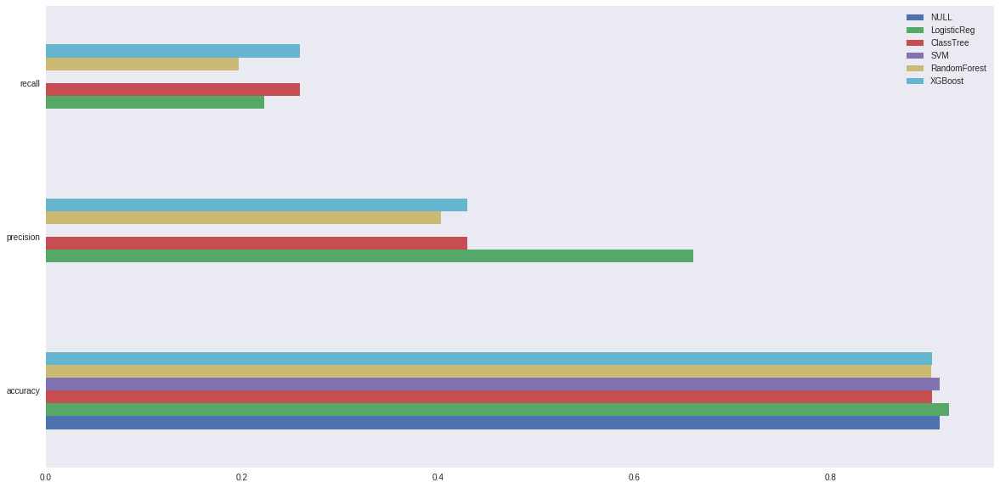

In [327]:
fig, ax = plt.subplots(figsize=(20,10))
metrics.plot(kind='barh', ax=ax)
ax.grid();